In [1]:
#Installing prerequisites
!pip install pandas numpy matplotlib seaborn nltk scikit-learn gensim spacy emoji tqdm --quiet
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
import spacy
spacy.cli.download("en_core_web_sm")


[nltk_data] Downloading package stopwords to /Users/kausy/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/kausy/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /Users/kausy/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


  Using cached https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.8.0/en_core_web_sm-3.8.0-py3-none-any.whl (12.8 MB)
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [3]:
#Loading the dataset
import pandas as pd

df = pd.read_csv('dataset.csv', low_memory=False)
df.head()


,app_id,app_name,review_text,review_score,review_votes
0,10,Counter-Strike,Ruined my life.,1,0
1,10,Counter-Strike,This will be more of a ''my experience with th...,1,1
2,10,Counter-Strike,This game saved my virginity.,1,0
3,10,Counter-Strike,• Do you like original games? • Do you like ga...,1,0
4,10,Counter-Strike,"Easy to learn, hard to master.",1,1


In [5]:
#Filtering for selected games and assigning them relevant genre labels
selected_games = {
    "PAYDAY 2": "Shooter",
    "Don't Starve Together": "Survival",
    "Terraria": "Sandbox",
    "Fallout: New Vegas": "RPG",
    "Dota 2": "MOBA",
    "Grand Theft Auto V": "Open World",
    "Cities: Skylines": "Simulation",
    "FTL: Faster Than Light": "Strategy",
    "Garry's Mod": "Puzzle",
    "Dead by Daylight": "Horror"
}

df_filtered = df[df['app_name'].isin(selected_games.keys())].copy()
df_filtered['genre'] = df_filtered['app_name'].map(selected_games)
df_filtered.head()


,app_id,app_name,review_text,review_score,review_votes,genre
68092,105600,Terraria,You can be a werewolf riding a unicorn while s...,1,0,Sandbox
68093,105600,Terraria,You should by 8 copies of this game and go aro...,1,0,Sandbox
68094,105600,Terraria,Introduction,1,1,Sandbox
68095,105600,Terraria,"If you have friends, this is a great game to p...",1,1,Sandbox
68096,105600,Terraria,A Generic Comparison of Terraria versus Minecr...,1,0,Sandbox


In [7]:
#Creating Sentiment Labels to see Positive and Negative reviews
df_filtered['sentiment'] = df_filtered['review_score'].apply(
    lambda x: 'positive' if x > 0 else ('negative' if x < 0 else 'neutral')
)

df_filtered['sentiment'].value_counts()


sentiment
positive    365379
negative     66969
Name: count, dtype: int64

In [9]:
#Reviewing count per game per sentiment
review_counts = df_filtered.groupby(['app_name', 'sentiment']).size().unstack(fill_value=0)
print(review_counts)


sentiment               negative  positive
app_name                                  
Cities: Skylines            1214     17920
Dead by Daylight            6495     12036
Don't Starve Together        666     17463
Dota 2                     10618     62923
FTL: Faster Than Light       776     25160
Fallout: New Vegas          1439     31524
Garry's Mod                 5056     22883
Grand Theft Auto V         11019     31355
PAYDAY 2                   27208     61765
Terraria                    2478     82350


In [11]:
#Defining Preprocessing Function
import re
import string
import spacy
from nltk.corpus import stopwords
from tqdm import tqdm

nlp = spacy.load("en_core_web_sm")
stop_words = set(stopwords.words("english"))

def preprocess_text(text):
    if pd.isna(text): return ""
    
    # 1. Lowercase
    text = text.lower()

    # 2. Custom cleaning as per EDA
    text = re.sub(r'\bearly\s*access\s*review\b', '', text)
    text = text.replace("❤", "*").replace("♥", "*")
    
    # 3. Remove punctuation and digits
    text = re.sub(r'[\d{}]'.format(re.escape(string.punctuation)), ' ', text)

    # 4. Tokenize and Lemmatize using spaCy
    doc = nlp(text)
    tokens = [token.lemma_ for token in doc if token.lemma_ not in stop_words and len(token) > 2 and not token.is_stop]

    # 5. Join cleaned tokens
    return " ".join(tokens)


In [13]:
#Applying Preprocessing
tqdm.pandas()
df_filtered['cleaned_review'] = df_filtered['review_text'].progress_apply(preprocess_text)

#Dropping empty rows after we removed early access reviews
df_filtered = df_filtered[df_filtered['cleaned_review'].str.strip() != '']

#Final Preview of Cleaned DF
df_filtered[['app_name', 'sentiment', 'cleaned_review']].head()


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 432348/432348 [48:23<00:00, 148.93it/s]


,app_name,sentiment,cleaned_review
68092,Terraria,positive,werewolf ride unicorn shoot rainbow gun build ...
68093,Terraria,positive,copy game give people look sad
68094,Terraria,positive,introduction
68095,Terraria,positive,friend great game play friend great game play ...
68096,Terraria,positive,generic comparison terraria versus minecraft ≈...


In [15]:
#Defining Wordcloud Function
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_wordcloud(text, title, max_words=100):
    wc = WordCloud(width=800, height=400, background_color='white', max_words=max_words).generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=16)
    plt.show()


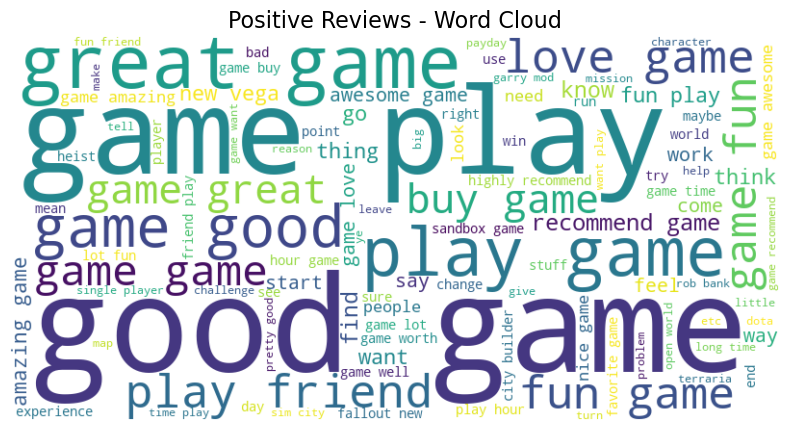

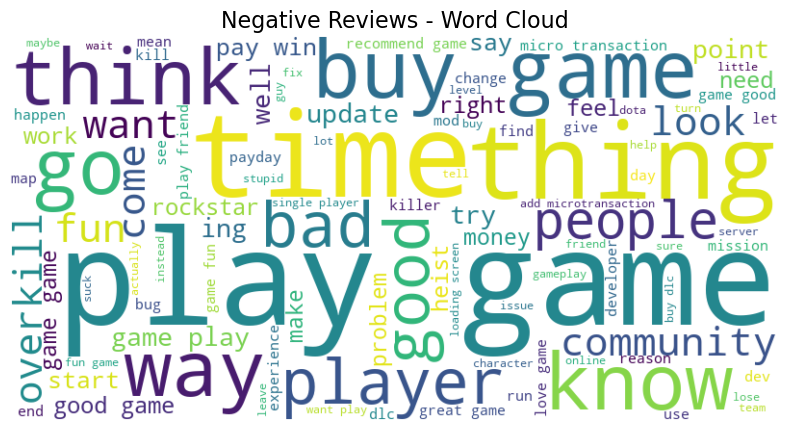

In [17]:
#Positive Wordcloud
positive_text = " ".join(df_filtered[df_filtered['sentiment'] == 'positive']['cleaned_review'].dropna())
plot_wordcloud(positive_text, "Positive Reviews - Word Cloud")

#Negative Wordcloud
negative_text = " ".join(df_filtered[df_filtered['sentiment'] == 'negative']['cleaned_review'].dropna())
plot_wordcloud(negative_text, "Negative Reviews - Word Cloud")


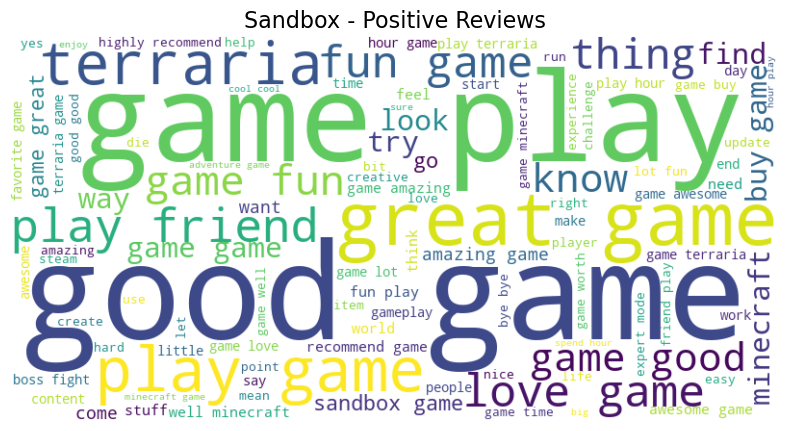

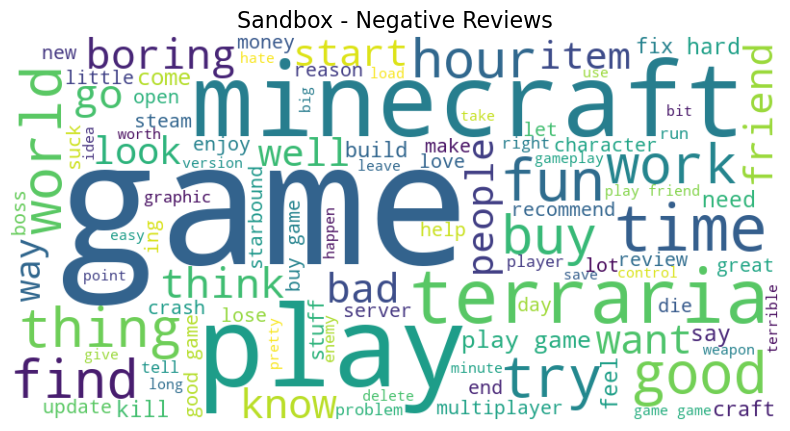

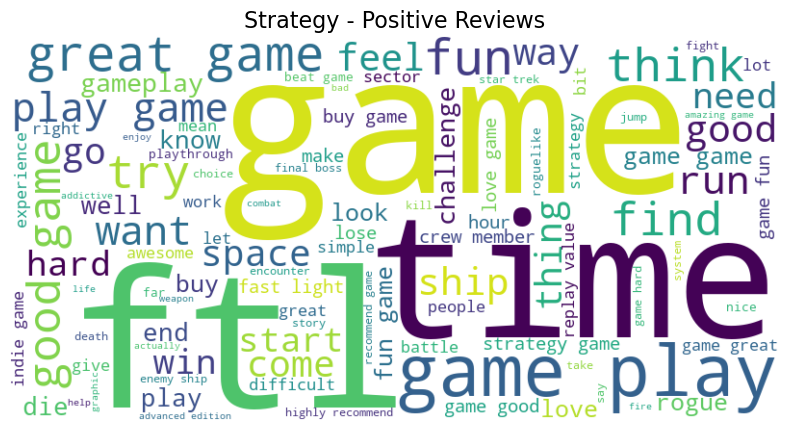

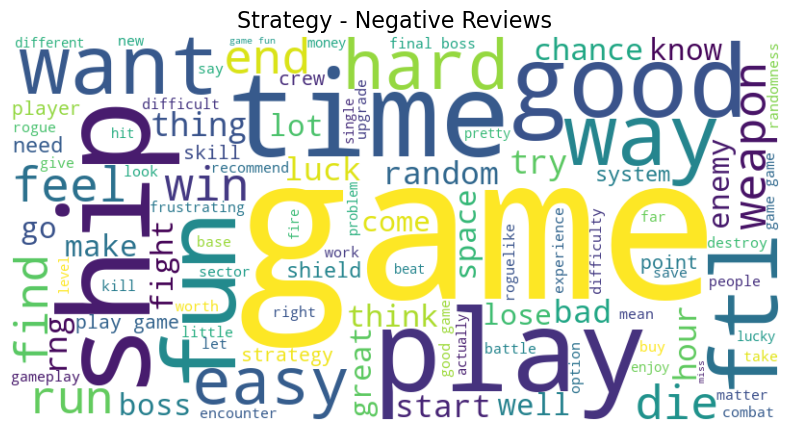

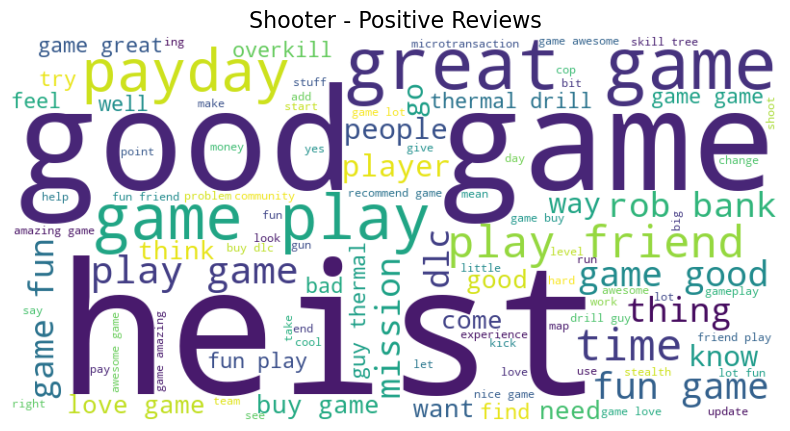

...

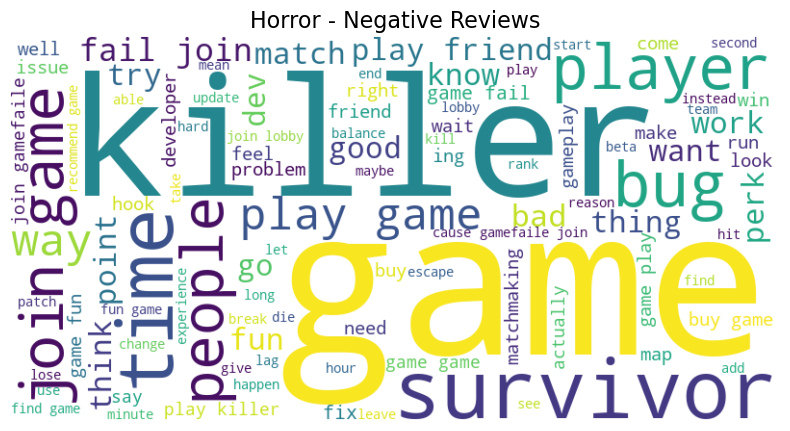

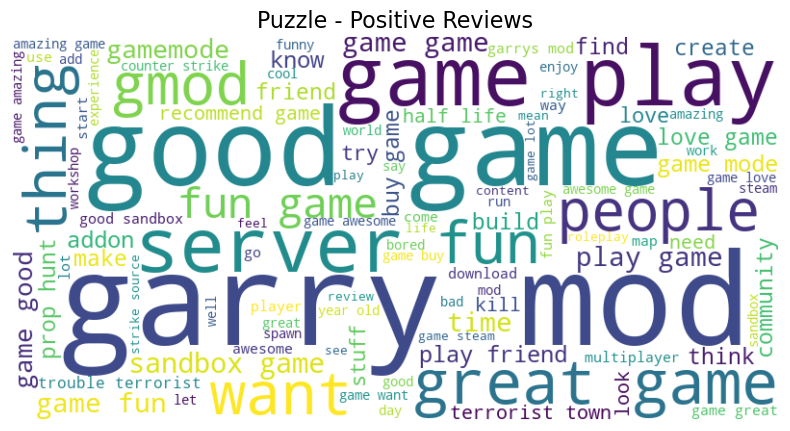

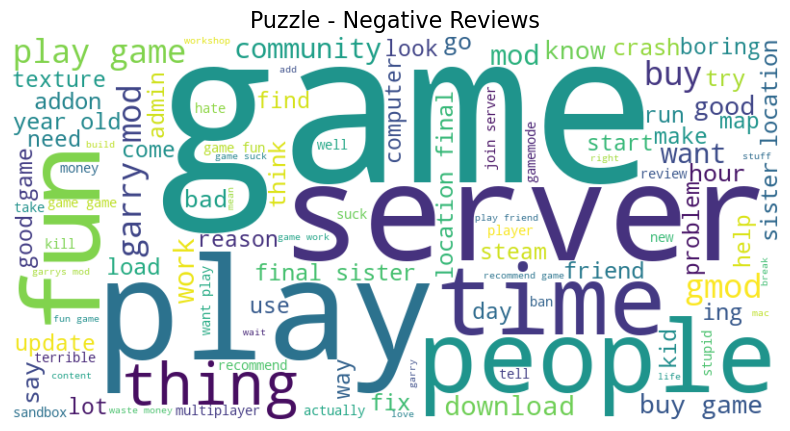

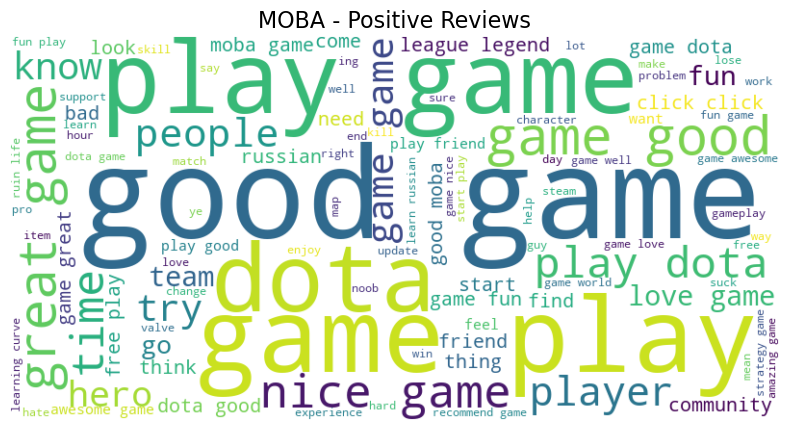

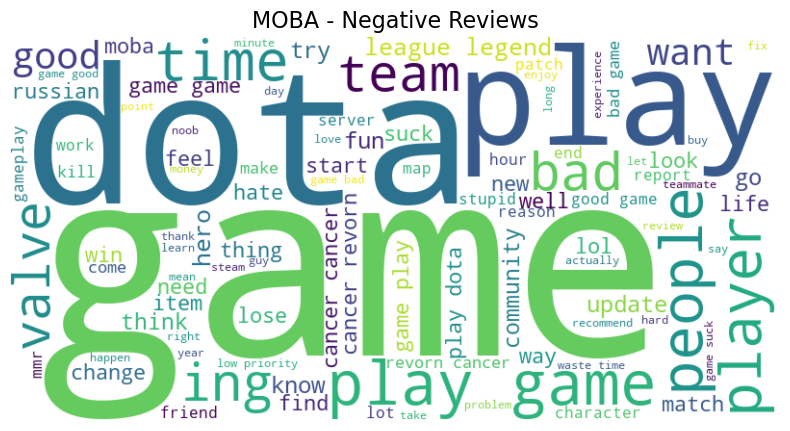

In [19]:
#Wordclouds by Genre and Sentiment
genres = df_filtered['genre'].unique()

for genre in genres:
    for sentiment in ['positive', 'negative']:
        subset = df_filtered[(df_filtered['genre'] == genre) & (df_filtered['sentiment'] == sentiment)]
        text = " ".join(subset['cleaned_review'].dropna())

        if text.strip():
            title = f"{genre} - {sentiment.capitalize()} Reviews"
            plot_wordcloud(text, title)


In [21]:
#Setting Up Vectorizers for LDA and LSA
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

num_features = 3000  # Limit to top N words
min_df = 5           # Word must appear in at least 5 reviews

#CountVectorizer for LDA
count_vectorizer = CountVectorizer(max_features=num_features, min_df=min_df)
count_dtm = count_vectorizer.fit_transform(df_filtered['cleaned_review'])

#TfidfVectorizer for LSA
tfidf_vectorizer = TfidfVectorizer(max_features=num_features, min_df=min_df)
tfidf_dtm = tfidf_vectorizer.fit_transform(df_filtered['cleaned_review'])


In [23]:
print("LDA DTM shape (CountVectorizer):", count_dtm.shape)
print("LSA DTM shape (TF-IDF):", tfidf_dtm.shape)
print("CountVectorizer vocab size:", len(count_vectorizer.get_feature_names_out()))
print("TfidfVectorizer vocab size:", len(tfidf_vectorizer.get_feature_names_out()))


LDA DTM shape (CountVectorizer): (411852, 3000)
LSA DTM shape (TF-IDF): (411852, 3000)
CountVectorizer vocab size: 3000
TfidfVectorizer vocab size: 3000


In [25]:
#Define Topic Models
def display_topics(model, feature_names, num_top_words=10):
    topics = []
    for idx, topic in enumerate(model.components_):
        words = [feature_names[i] for i in topic.argsort()[:-num_top_words - 1:-1]]
        print(f"Topic #{idx+1}: {', '.join(words)}")
        topics.append(words)
    print()
    return topics


In [27]:
#Running the models on the data by Genre and Sentiment
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation

n_topics = 5

genres = df_filtered['genre'].unique()
sentiments = ['positive', 'negative']

for genre in genres:
    for sentiment in sentiments:
        subset = df_filtered[(df_filtered['genre'] == genre) & (df_filtered['sentiment'] == sentiment)]
        texts = subset['cleaned_review'].dropna()

        if len(texts) < 100:
            print(f"Skipping {genre} - {sentiment}: Not enough reviews ({len(texts)})")
            continue

        print(f"=== {genre.upper()} - {sentiment.upper()} ===")
        print(f"Total reviews: {len(texts)}")

        # CountVectorizer for LDA
        count_vec = CountVectorizer(max_features=1000, min_df=5)
        count_dtm = count_vec.fit_transform(texts)

        lda = LatentDirichletAllocation(n_components=n_topics, random_state=42, learning_method='batch')
        lda.fit(count_dtm)

        print("LDA Topics:")
        lda_topics = display_topics(lda, count_vec.get_feature_names_out())

        # TF-IDF for LSA
        tfidf_vec = TfidfVectorizer(max_features=1000, min_df=5)
        tfidf_dtm = tfidf_vec.fit_transform(texts)

        lsa = TruncatedSVD(n_components=n_topics, random_state=42)
        lsa.fit(tfidf_dtm)

        print("LSA Topics:")
        lsa_topics = display_topics(lsa, tfidf_vec.get_feature_names_out())

        print("="*60)


=== SANDBOX - POSITIVE ===
Total reviews: 81165
LDA Topics:
Topic #1: game, boss, terraria, item, world, build, fight, like, weapon, minecraft
Topic #2: game, awesome, cool, play, like, want, good, love, life, review
Topic #3: game, play, fun, great, friend, hour, time, love, good, amazing
Topic #4: game, minecraft, good, like, terraria, well, buy, play, worth, think
Topic #5: game, terraria, get, time, play, start, new, kill, find, come

LSA Topics:
Topic #1: game, good, play, fun, great, minecraft, like, love, terraria, friend
Topic #2: good, pretty, game, steam, indie, guess, hey, simulator, tis, yeah
Topic #3: great, game, love, favorite, value, awsome, mac, pass, age, replayability
Topic #4: fun, play, friend, hour, lot, time, addict, addictive, spend, stop
Topic #5: love, awesome, game, amazing, buy, hour, update, favorite, new, life

=== SANDBOX - NEGATIVE ===
Total reviews: 2435
LDA Topics:
Topic #1: game, buy, suck, terraria, review, ing, work, refund, negative, download
Topic

In [29]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import os

# 🔖 Make output directory
output_dir = "tsne_plots"
os.makedirs(output_dir, exist_ok=True)

# 🧠 Save t-SNE plots
def save_tsne_plot(tsne_matrix, topic_matrix, title, filename):
    df_vis = pd.DataFrame(tsne_matrix, columns=["x", "y"])
    df_vis["topic"] = topic_matrix.argmax(axis=1)

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df_vis, x="x", y="y", hue="topic", palette="tab10", alpha=0.7)
    plt.title(title)
    plt.legend(title="Topic", loc='best')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, filename))
    plt.close()

# 🔁 Loop over all genres + sentiments
for genre in df_filtered['genre'].unique():
    for sentiment in ['positive', 'negative']:
        subset = df_filtered[(df_filtered['genre'] == genre) & (df_filtered['sentiment'] == sentiment)]
        texts = subset['cleaned_review'].dropna()

        if len(texts) < 500:
            print(f"Skipping {genre} - {sentiment} (only {len(texts)} reviews)")
            continue

        print(f"Processing {genre} - {sentiment}...")

        # Vectorizers
        count_vec = CountVectorizer(max_features=1000, min_df=5)
        tfidf_vec = TfidfVectorizer(max_features=1000, min_df=5)

        count_dtm = count_vec.fit_transform(texts)
        tfidf_dtm = tfidf_vec.fit_transform(texts)

        # Models
        n_topics = 5
        lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
        lda_matrix = lda.fit_transform(count_dtm)

        lsa = TruncatedSVD(n_components=n_topics, random_state=42)
        lsa_matrix = lsa.fit_transform(tfidf_dtm)

        # t-SNE
        tsne_lda = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(lda_matrix)
        tsne_lsa = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(lsa_matrix)

        # Save plots
        save_tsne_plot(tsne_lda, lda_matrix, f"LDA t-SNE: {genre} - {sentiment}", f"{genre}_{sentiment}_lda.png")
        save_tsne_plot(tsne_lsa, lsa_matrix, f"LSA t-SNE: {genre} - {sentiment}", f"{genre}_{sentiment}_lsa.png")


Processing Sandbox - positive...
Processing Sandbox - negative...
Processing Strategy - positive...
Processing Strategy - negative...
Processing Shooter - positive...
Processing Shooter - negative...
Processing RPG - positive...
Processing RPG - negative...
Processing Simulation - positive...
Processing Simulation - negative...
Processing Open World - positive...
Processing Open World - negative...
Processing Survival - positive...
Skipping Survival - negative (only 257 reviews)
Processing Horror - positive...
Processing Horror - negative...
Processing Puzzle - positive...
Processing Puzzle - negative...
Processing MOBA - positive...
Processing MOBA - negative...


In [31]:
import numpy as np

def plot_topic_distribution(topic_matrix, model_name, genre, sentiment):
    topic_labels = np.argmax(topic_matrix, axis=1)
    topic_counts = pd.Series(topic_labels).value_counts().sort_index()
    
    plt.figure(figsize=(6, 4))
    sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")
    plt.title(f"{model_name} Topic Distribution\n{genre} - {sentiment}")
    plt.xlabel("Topic")
    plt.ylabel("Document Count")
    plt.tight_layout()
    plt.show()


In [33]:
import seaborn as sns

def plot_topic_keywords_heatmap(model, feature_names, model_name, genre, sentiment, top_n=10):
    keywords = []
    for topic_weights in model.components_:
        top_words_idx = topic_weights.argsort()[-top_n:][::-1]
        keywords.append([feature_names[i] for i in top_words_idx])

    df_keywords = pd.DataFrame(keywords, columns=[f"Word {i+1}" for i in range(top_n)])
    df_keywords.index = [f"Topic {i}" for i in range(len(keywords))]

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_keywords.apply(lambda x: pd.factorize(x)[0]), annot=df_keywords, fmt="", cmap="YlGnBu", cbar=False)
    plt.title(f"{model_name} Topic Keywords Heatmap\n{genre} - {sentiment}")
    plt.tight_layout()
    plt.show()


In [35]:
from gensim.models import CoherenceModel
from gensim.corpora.dictionary import Dictionary

def compute_coherence_score(texts, topic_words, measure='c_v'):
    tokenized = [text.split() for text in texts]
    dictionary = Dictionary(tokenized)
    corpus = [dictionary.doc2bow(text) for text in tokenized]

    coherence_model = CoherenceModel(topics=topic_words, texts=tokenized,
                                      dictionary=dictionary, coherence=measure)
    return coherence_model.get_coherence()



🔍 ANALYZING: SANDBOX - POSITIVE
📝 Total Reviews: 81165


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


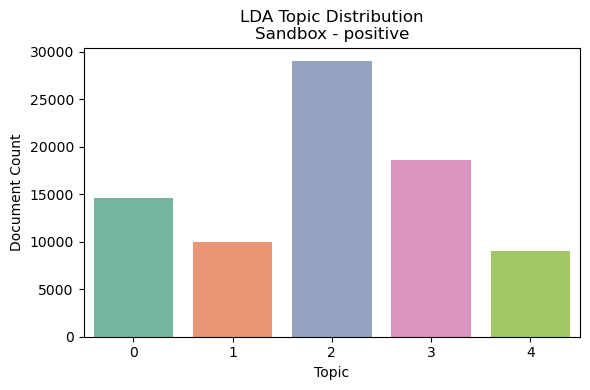

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


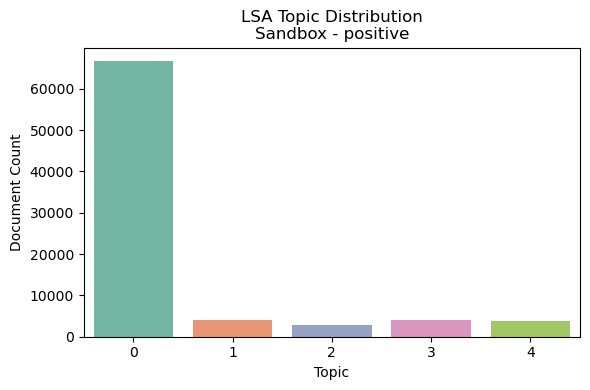

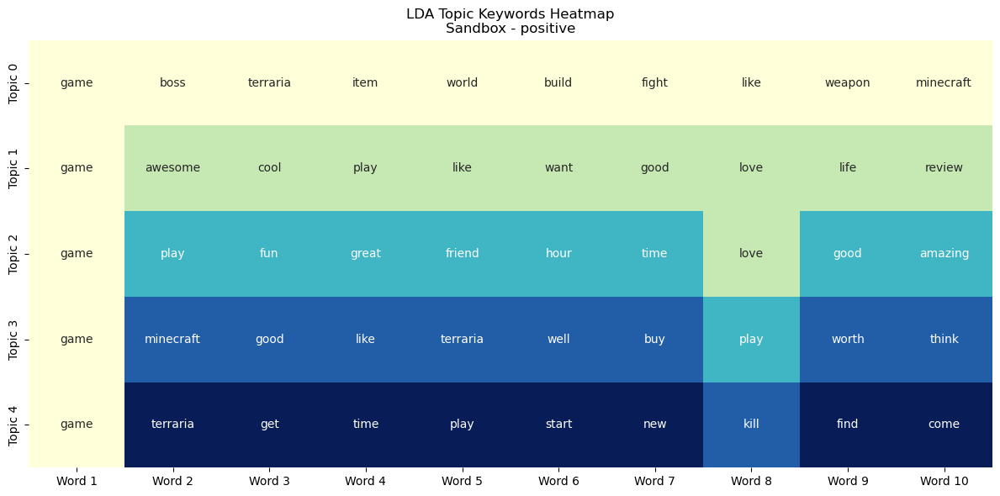

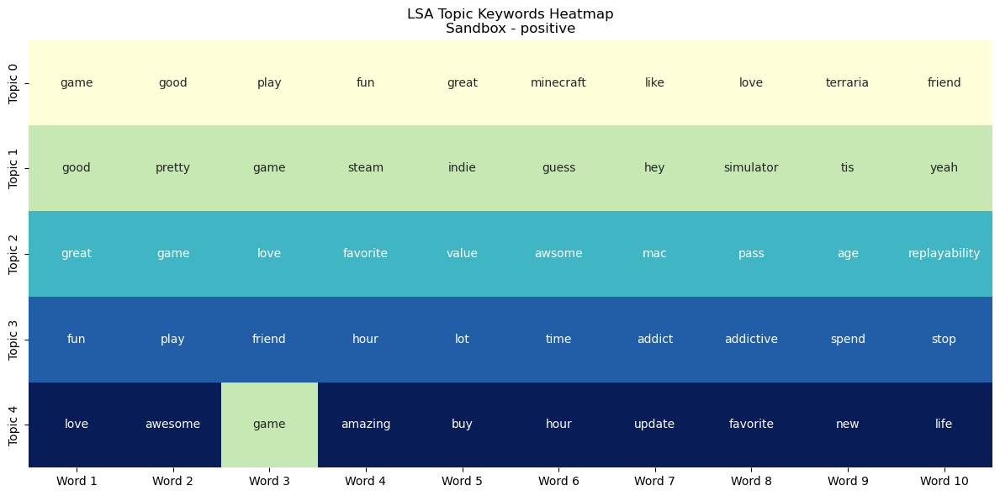

Topic #1: game, boss, terraria, item, world, build, fight, like, weapon, minecraft
Topic #2: game, awesome, cool, play, like, want, good, love, life, review
Topic #3: game, play, fun, great, friend, hour, time, love, good, amazing
Topic #4: game, minecraft, good, like, terraria, well, buy, play, worth, think
Topic #5: game, terraria, get, time, play, start, new, kill, find, come

Topic #1: game, good, play, fun, great, minecraft, like, love, terraria, friend
Topic #2: good, pretty, game, steam, indie, guess, hey, simulator, tis, yeah
Topic #3: great, game, love, favorite, value, awsome, mac, pass, age, replayability
Topic #4: fun, play, friend, hour, lot, time, addict, addictive, spend, stop
Topic #5: love, awesome, game, amazing, buy, hour, update, favorite, new, life

📏 Coherence Score (LDA): 0.5514
📏 Coherence Score (LSA): 0.4430
🔚==================================================

🔍 ANALYZING: SANDBOX - NEGATIVE
📝 Total Reviews: 2435


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


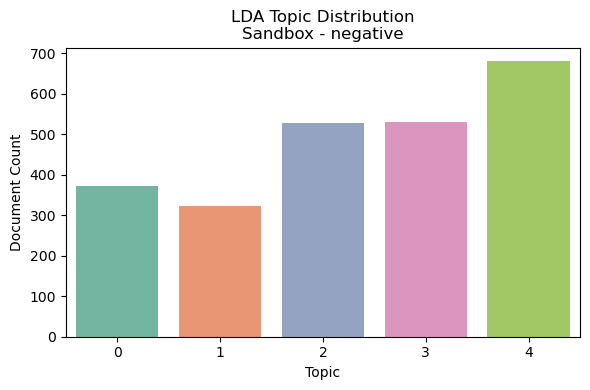

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


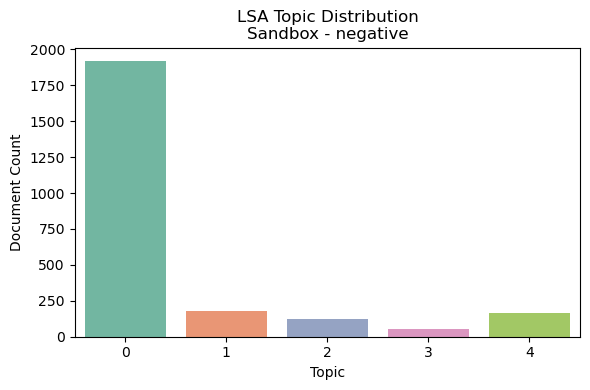

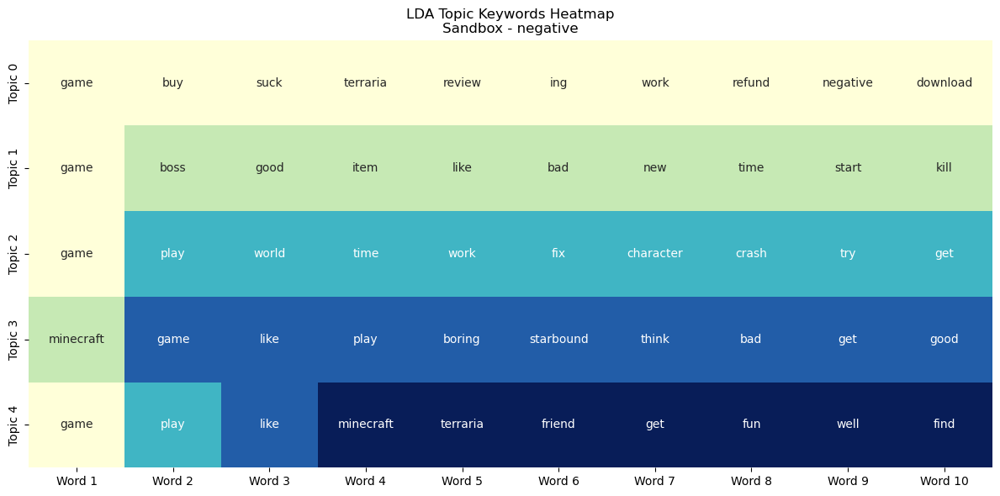

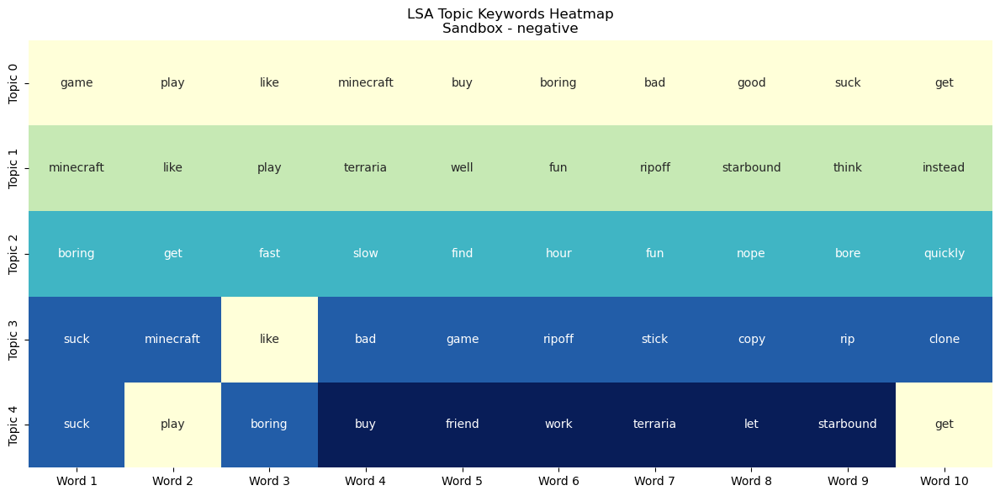

Topic #1: game, buy, suck, terraria, review, ing, work, refund, negative, download
Topic #2: game, boss, good, item, like, bad, new, time, start, kill
Topic #3: game, play, world, time, work, fix, character, crash, try, get
Topic #4: minecraft, game, like, play, boring, starbound, think, bad, get, good
Topic #5: game, play, like, minecraft, terraria, friend, get, fun, well, find

Topic #1: game, play, like, minecraft, buy, boring, bad, good, suck, get
Topic #2: minecraft, like, play, terraria, well, fun, ripoff, starbound, think, instead
Topic #3: boring, get, fast, slow, find, hour, fun, nope, bore, quickly
Topic #4: suck, minecraft, like, bad, game, ripoff, stick, copy, rip, clone
Topic #5: suck, play, boring, buy, friend, work, terraria, let, starbound, get

📏 Coherence Score (LDA): 0.4929
📏 Coherence Score (LSA): 0.4170
🔚==================================================

🔍 ANALYZING: STRATEGY - POSITIVE
📝 Total Reviews: 24954


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


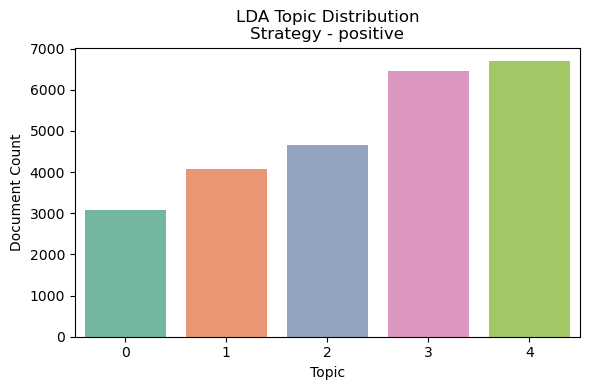

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


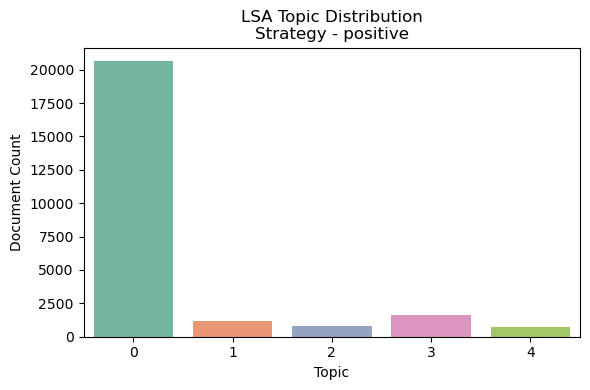

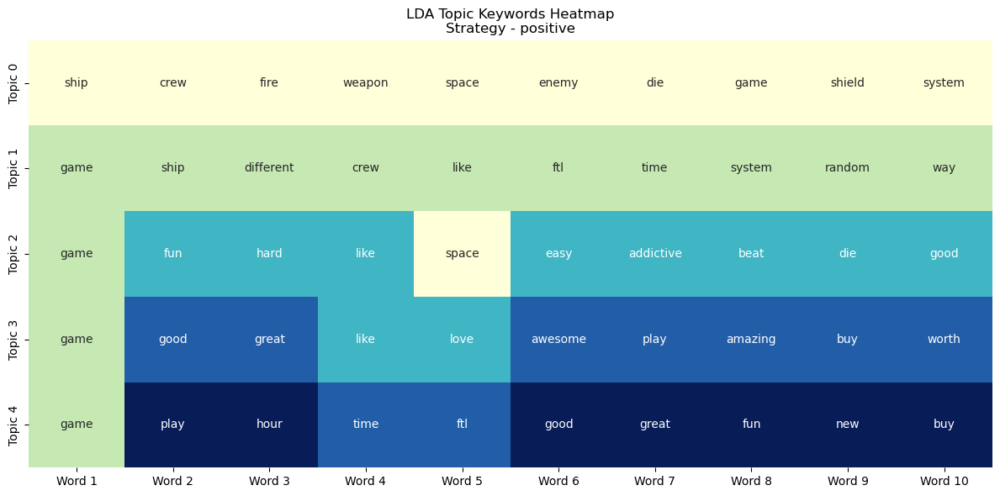

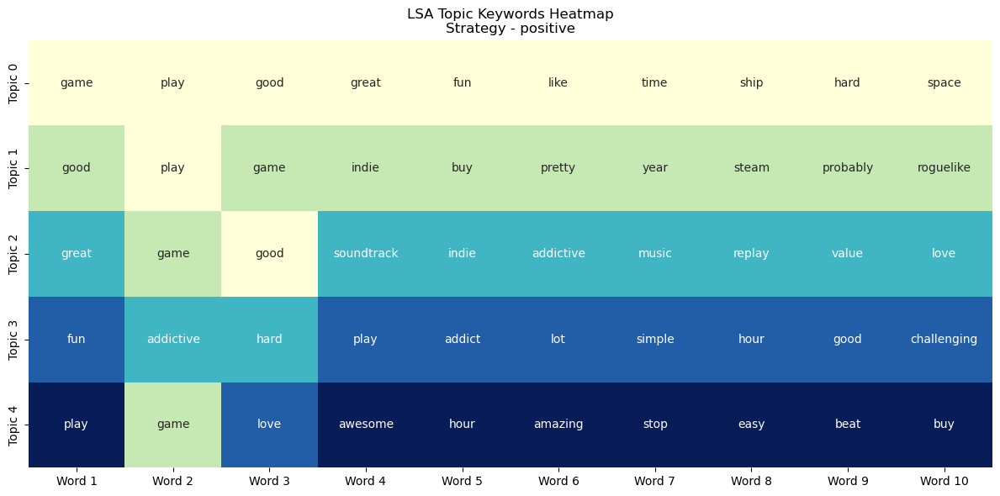

Topic #1: ship, crew, fire, weapon, space, enemy, die, game, shield, system
Topic #2: game, ship, different, crew, like, ftl, time, system, random, way
Topic #3: game, fun, hard, like, space, easy, addictive, beat, die, good
Topic #4: game, good, great, like, love, awesome, play, amazing, buy, worth
Topic #5: game, play, hour, time, ftl, good, great, fun, new, buy

Topic #1: game, play, good, great, fun, like, time, ship, hard, space
Topic #2: good, play, game, indie, buy, pretty, year, steam, probably, roguelike
Topic #3: great, game, good, soundtrack, indie, addictive, music, replay, value, love
Topic #4: fun, addictive, hard, play, addict, lot, simple, hour, good, challenging
Topic #5: play, game, love, awesome, hour, amazing, stop, easy, beat, buy

📏 Coherence Score (LDA): 0.4979
📏 Coherence Score (LSA): 0.4499
🔚==================================================

🔍 ANALYZING: STRATEGY - NEGATIVE
📝 Total Reviews: 774


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


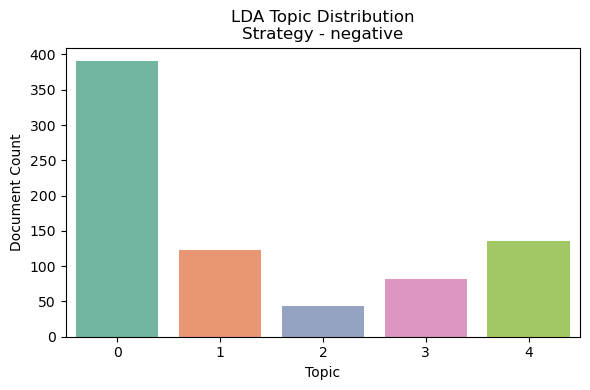

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


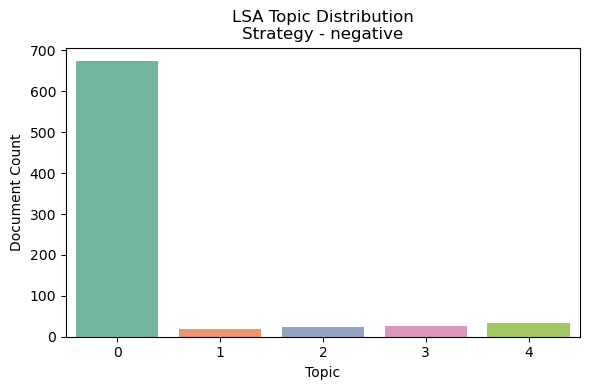

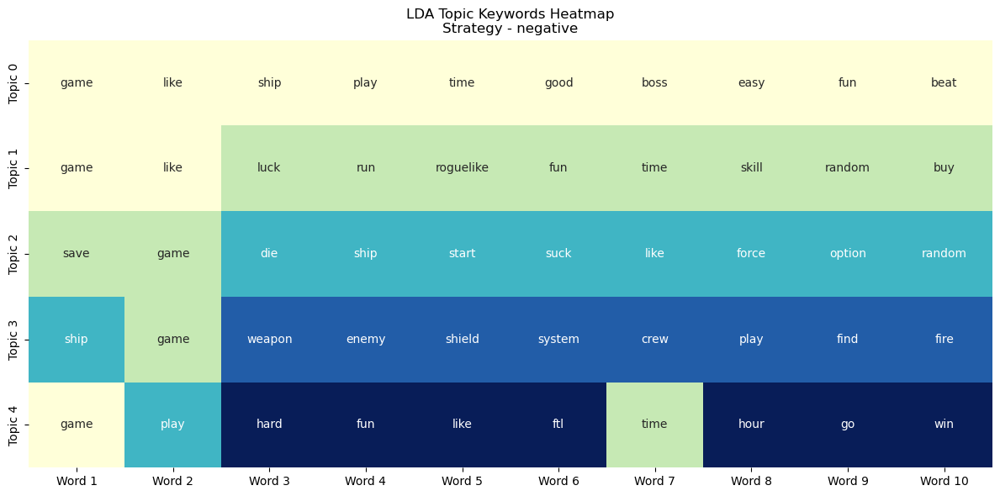

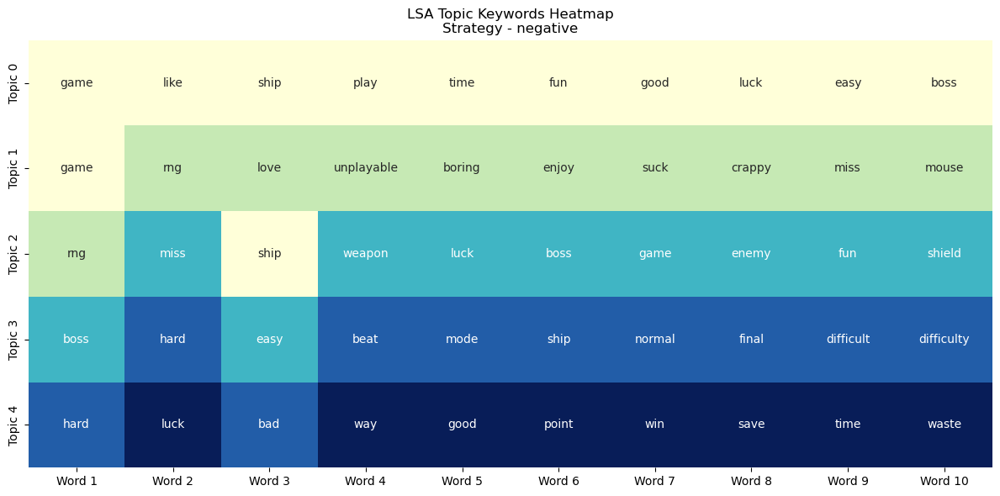

Topic #1: game, like, ship, play, time, good, boss, easy, fun, beat
Topic #2: game, like, luck, run, roguelike, fun, time, skill, random, buy
Topic #3: save, game, die, ship, start, suck, like, force, option, random
Topic #4: ship, game, weapon, enemy, shield, system, crew, play, find, fire
Topic #5: game, play, hard, fun, like, ftl, time, hour, go, win

Topic #1: game, like, ship, play, time, fun, good, luck, easy, boss
Topic #2: game, rng, love, unplayable, boring, enjoy, suck, crappy, miss, mouse
Topic #3: rng, miss, ship, weapon, luck, boss, game, enemy, fun, shield
Topic #4: boss, hard, easy, beat, mode, ship, normal, final, difficult, difficulty
Topic #5: hard, luck, bad, way, good, point, win, save, time, waste

📏 Coherence Score (LDA): 0.4823
📏 Coherence Score (LSA): 0.4369
🔚==================================================

🔍 ANALYZING: SHOOTER - POSITIVE
📝 Total Reviews: 60695


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


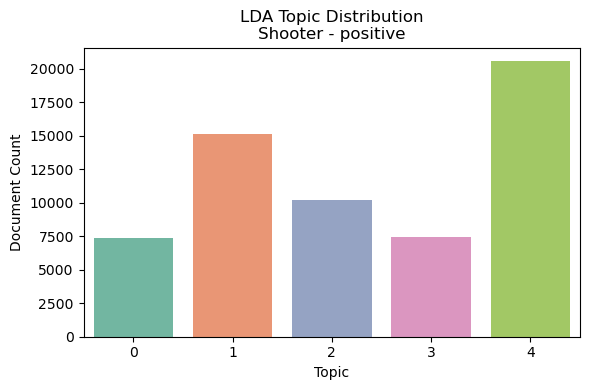

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


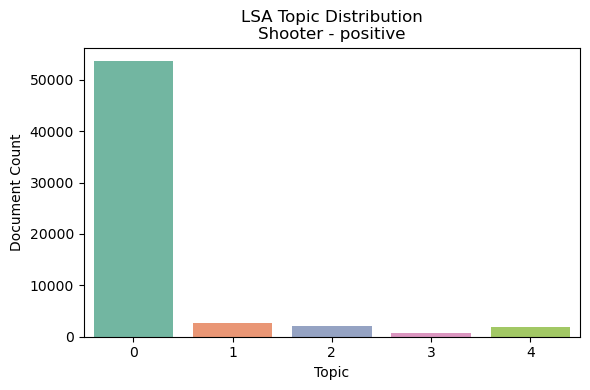

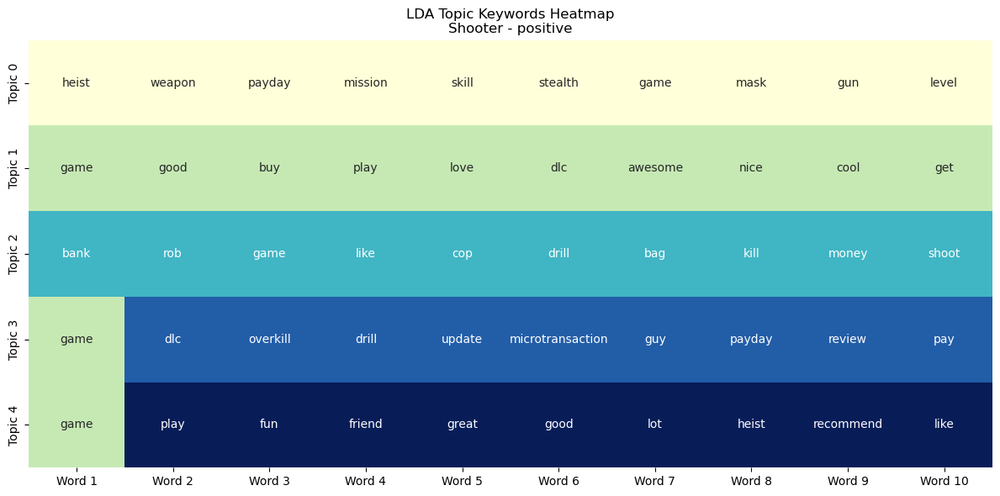

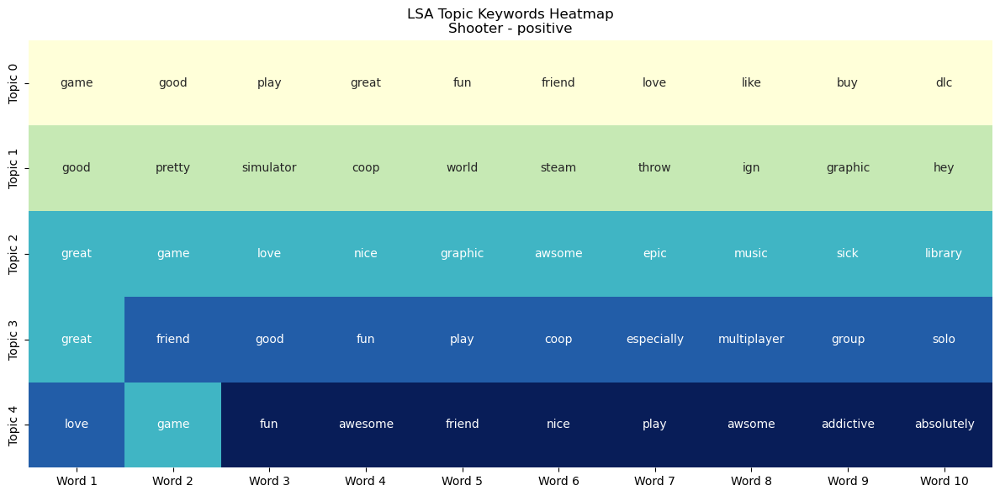

Topic #1: heist, weapon, payday, mission, skill, stealth, game, mask, gun, level
Topic #2: game, good, buy, play, love, dlc, awesome, nice, cool, get
Topic #3: bank, rob, game, like, cop, drill, bag, kill, money, shoot
Topic #4: game, dlc, overkill, drill, update, microtransaction, guy, payday, review, pay
Topic #5: game, play, fun, friend, great, good, lot, heist, recommend, like

Topic #1: game, good, play, great, fun, friend, love, like, buy, dlc
Topic #2: good, pretty, simulator, coop, world, steam, throw, ign, graphic, hey
Topic #3: great, game, love, nice, graphic, awsome, epic, music, sick, library
Topic #4: great, friend, good, fun, play, coop, especially, multiplayer, group, solo
Topic #5: love, game, fun, awesome, friend, nice, play, awsome, addictive, absolutely

📏 Coherence Score (LDA): 0.5442
📏 Coherence Score (LSA): 0.4347
🔚==================================================

🔍 ANALYZING: SHOOTER - NEGATIVE
📝 Total Reviews: 26916


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


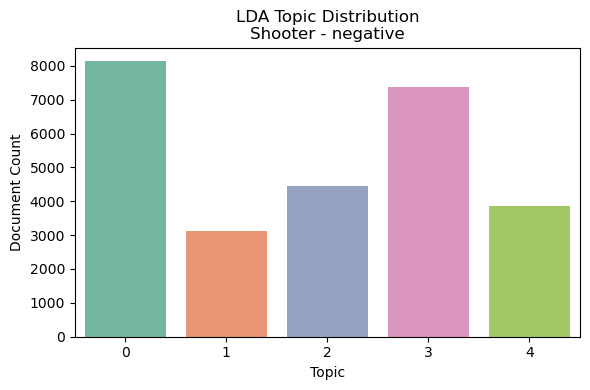

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


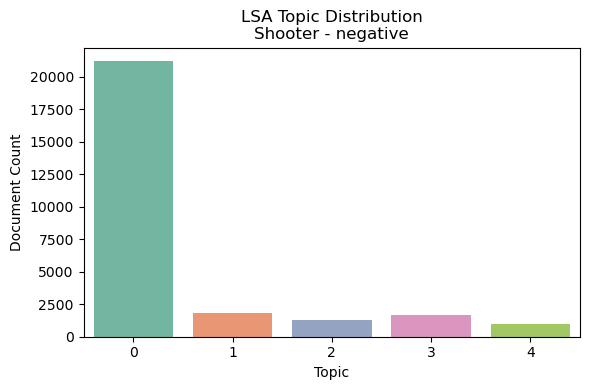

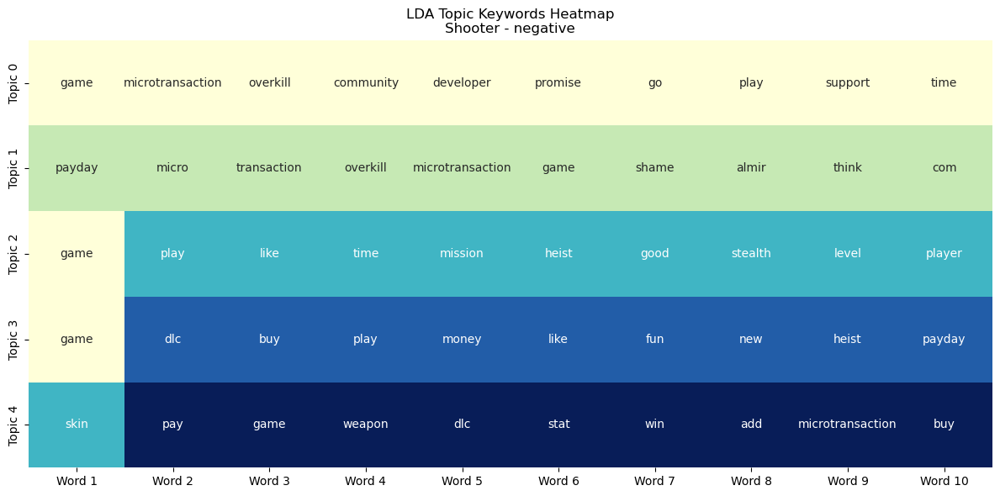

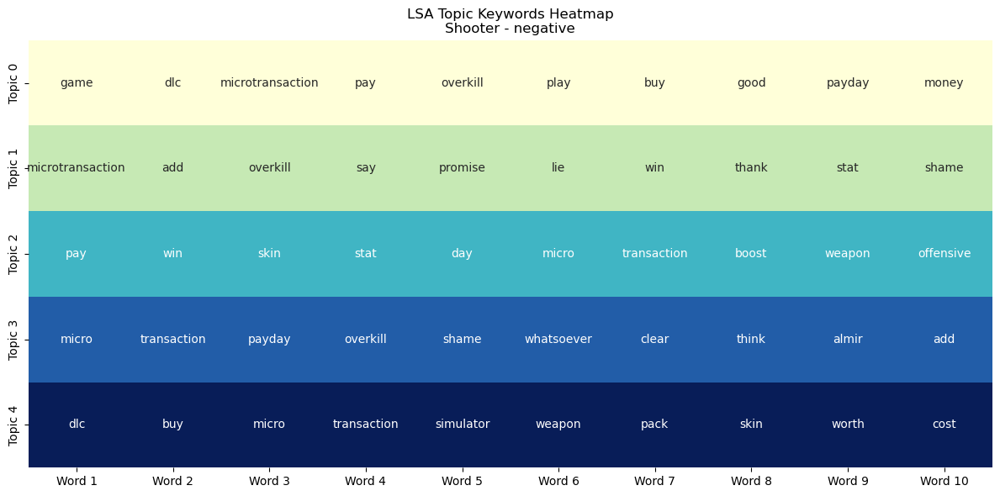

Topic #1: game, microtransaction, overkill, community, developer, promise, go, play, support, time
Topic #2: payday, micro, transaction, overkill, microtransaction, game, shame, almir, think, com
Topic #3: game, play, like, time, mission, heist, good, stealth, level, player
Topic #4: game, dlc, buy, play, money, like, fun, new, heist, payday
Topic #5: skin, pay, game, weapon, dlc, stat, win, add, microtransaction, buy

Topic #1: game, dlc, microtransaction, pay, overkill, play, buy, good, payday, money
Topic #2: microtransaction, add, overkill, say, promise, lie, win, thank, stat, shame
Topic #3: pay, win, skin, stat, day, micro, transaction, boost, weapon, offensive
Topic #4: micro, transaction, payday, overkill, shame, whatsoever, clear, think, almir, add
Topic #5: dlc, buy, micro, transaction, simulator, weapon, pack, skin, worth, cost

📏 Coherence Score (LDA): 0.5269
📏 Coherence Score (LSA): 0.5773
🔚==================================================

🔍 ANALYZING: RPG - POSITIVE
📝 T

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


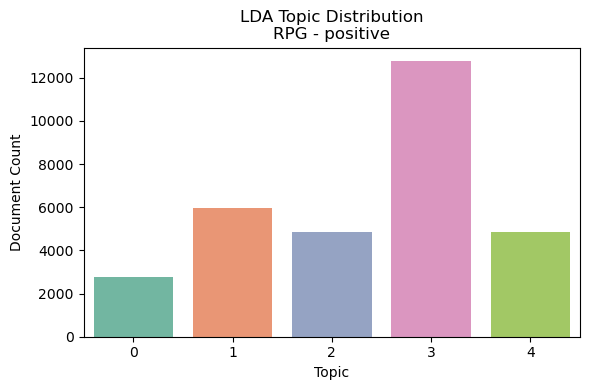

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


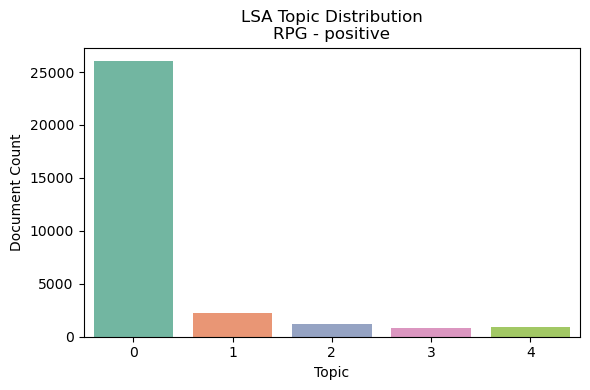

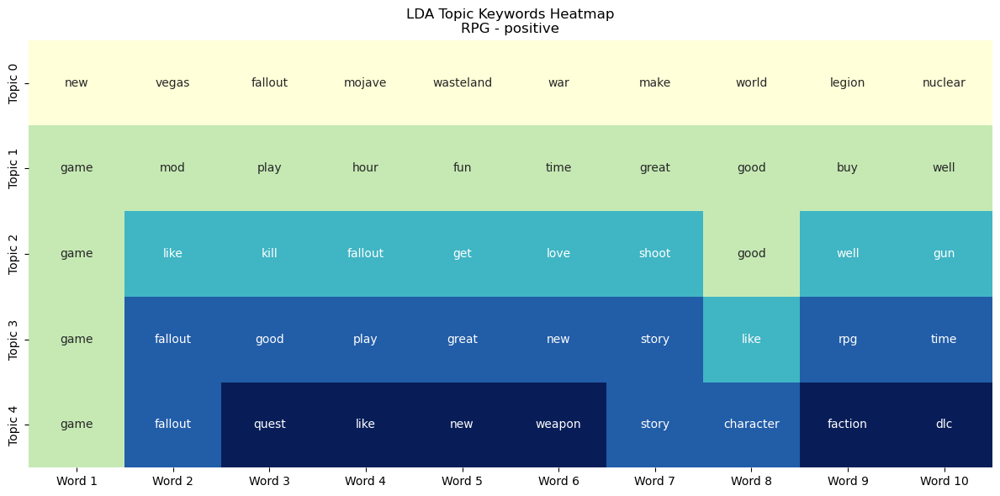

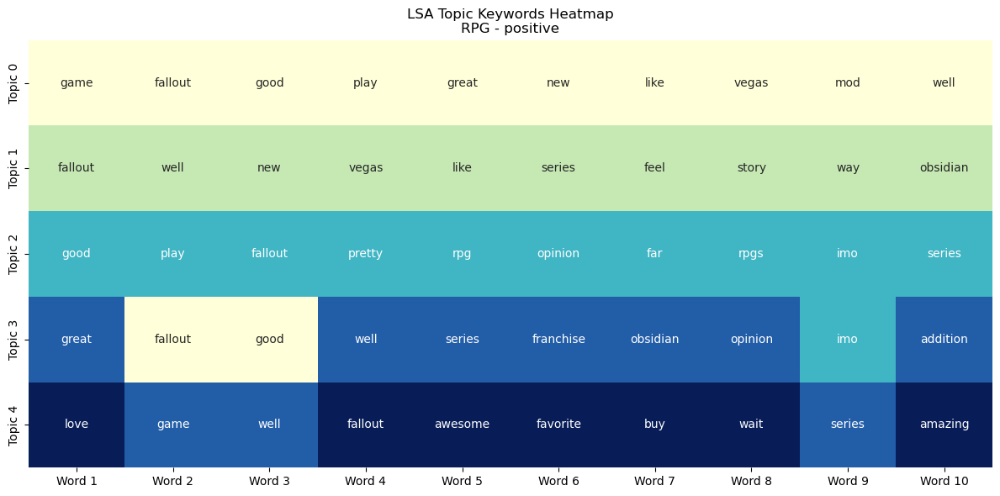

Topic #1: new, vegas, fallout, mojave, wasteland, war, make, world, legion, nuclear
Topic #2: game, mod, play, hour, fun, time, great, good, buy, well
Topic #3: game, like, kill, fallout, get, love, shoot, good, well, gun
Topic #4: game, fallout, good, play, great, new, story, like, rpg, time
Topic #5: game, fallout, quest, like, new, weapon, story, character, faction, dlc

Topic #1: game, fallout, good, play, great, new, like, vegas, mod, well
Topic #2: fallout, well, new, vegas, like, series, feel, story, way, obsidian
Topic #3: good, play, fallout, pretty, rpg, opinion, far, rpgs, imo, series
Topic #4: great, fallout, good, well, series, franchise, obsidian, opinion, imo, addition
Topic #5: love, game, well, fallout, awesome, favorite, buy, wait, series, amazing

📏 Coherence Score (LDA): 0.5040
📏 Coherence Score (LSA): 0.4922
🔚==================================================

🔍 ANALYZING: RPG - NEGATIVE
📝 Total Reviews: 1433


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


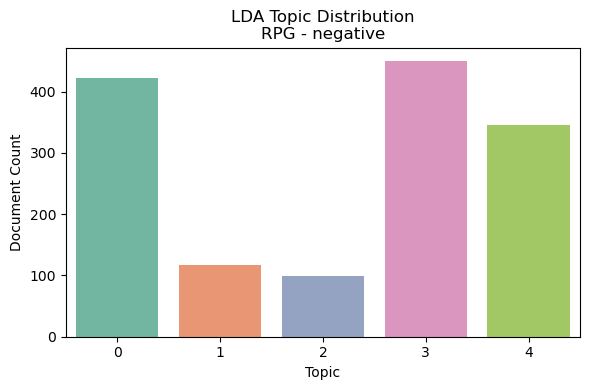

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


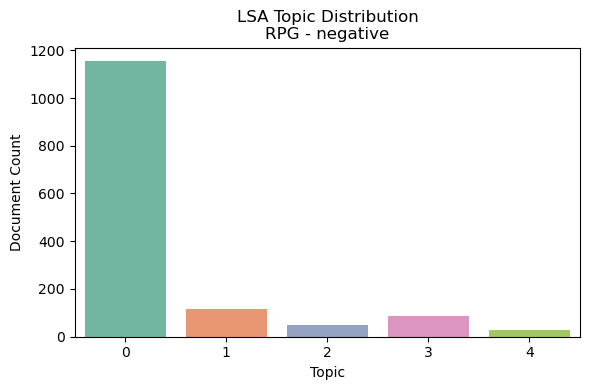

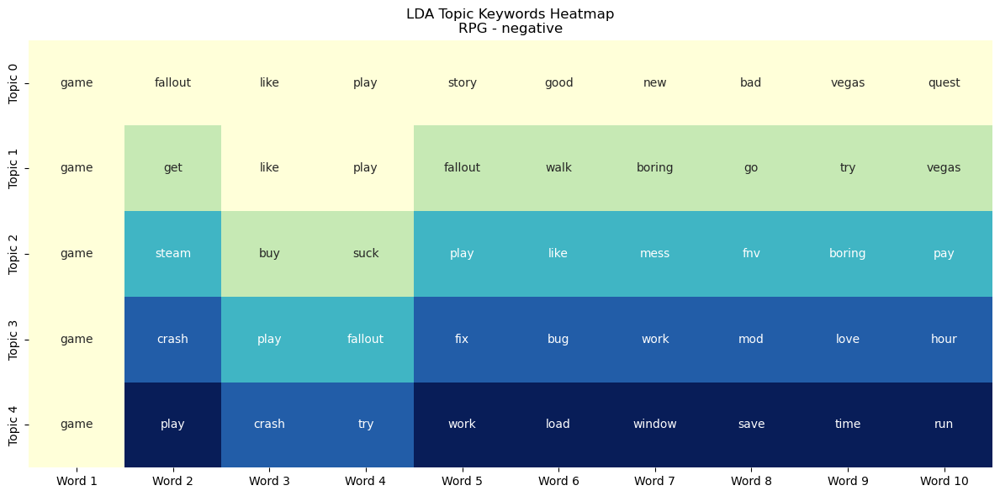

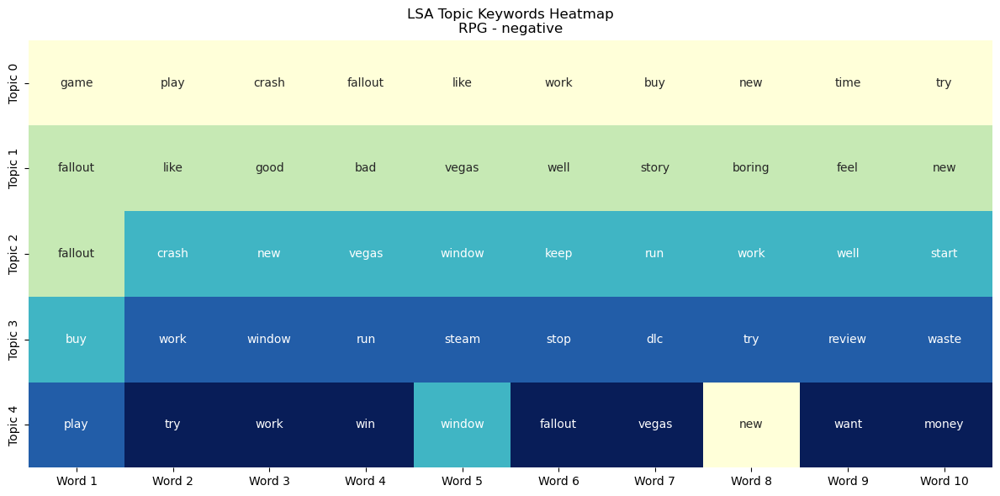

Topic #1: game, fallout, like, play, story, good, new, bad, vegas, quest
Topic #2: game, get, like, play, fallout, walk, boring, go, try, vegas
Topic #3: game, steam, buy, suck, play, like, mess, fnv, boring, pay
Topic #4: game, crash, play, fallout, fix, bug, work, mod, love, hour
Topic #5: game, play, crash, try, work, load, window, save, time, run

Topic #1: game, play, crash, fallout, like, work, buy, new, time, try
Topic #2: fallout, like, good, bad, vegas, well, story, boring, feel, new
Topic #3: fallout, crash, new, vegas, window, keep, run, work, well, start
Topic #4: buy, work, window, run, steam, stop, dlc, try, review, waste
Topic #5: play, try, work, win, window, fallout, vegas, new, want, money

📏 Coherence Score (LDA): 0.4376
📏 Coherence Score (LSA): 0.4045
🔚==================================================

🔍 ANALYZING: SIMULATION - POSITIVE
📝 Total Reviews: 17745


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


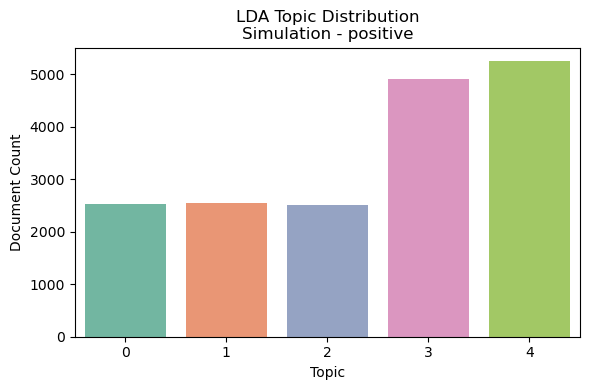

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


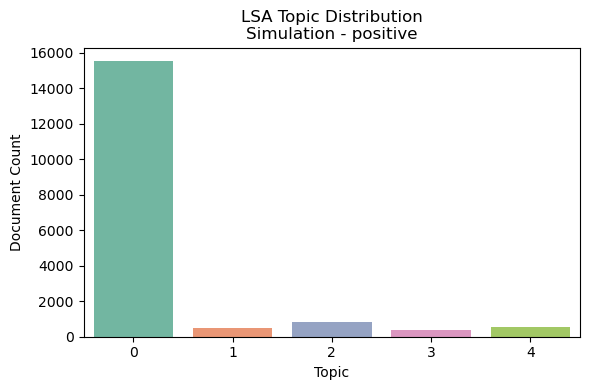

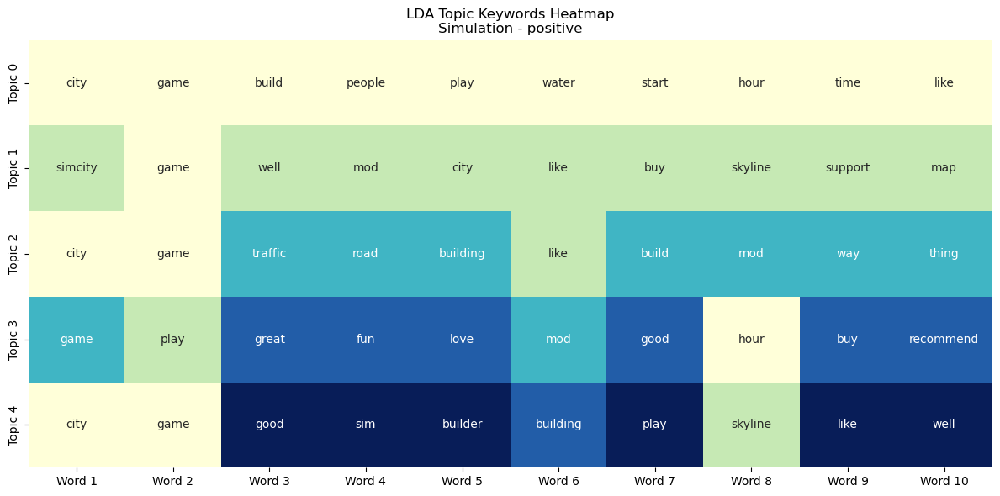

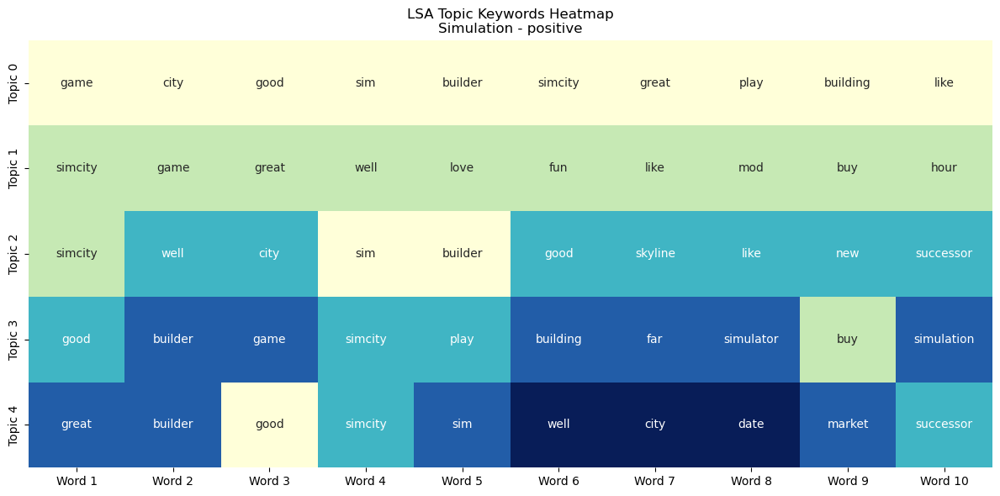

Topic #1: city, game, build, people, play, water, start, hour, time, like
Topic #2: simcity, game, well, mod, city, like, buy, skyline, support, map
Topic #3: city, game, traffic, road, building, like, build, mod, way, thing
Topic #4: game, play, great, fun, love, mod, good, hour, buy, recommend
Topic #5: city, game, good, sim, builder, building, play, skyline, like, well

Topic #1: game, city, good, sim, builder, simcity, great, play, building, like
Topic #2: simcity, game, great, well, love, fun, like, mod, buy, hour
Topic #3: simcity, well, city, sim, builder, good, skyline, like, new, successor
Topic #4: good, builder, game, simcity, play, building, far, simulator, buy, simulation
Topic #5: great, builder, good, simcity, sim, well, city, date, market, successor

📏 Coherence Score (LDA): 0.4711
📏 Coherence Score (LSA): 0.4521
🔚==================================================

🔍 ANALYZING: SIMULATION - NEGATIVE
📝 Total Reviews: 1208


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


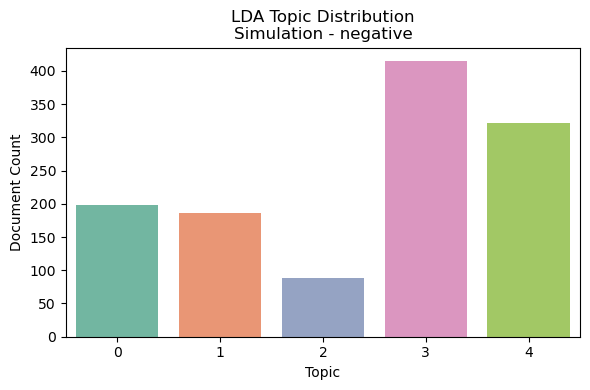

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


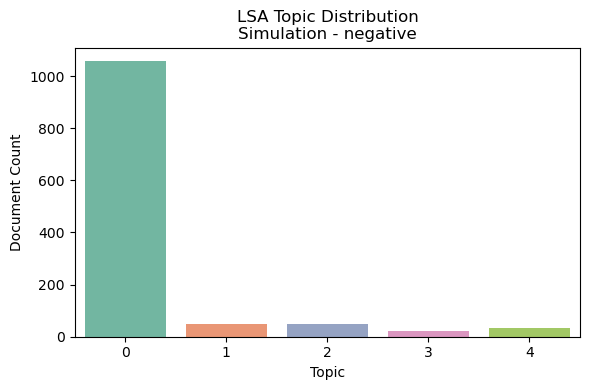

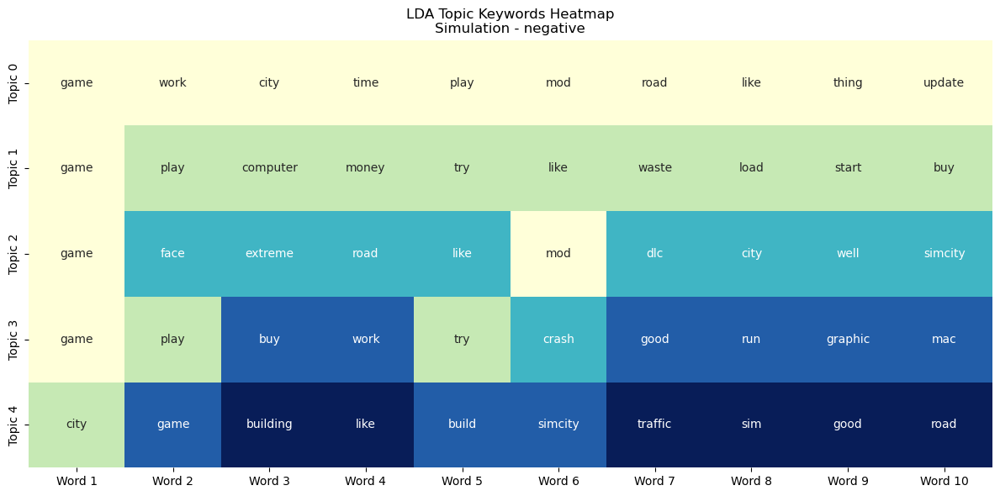

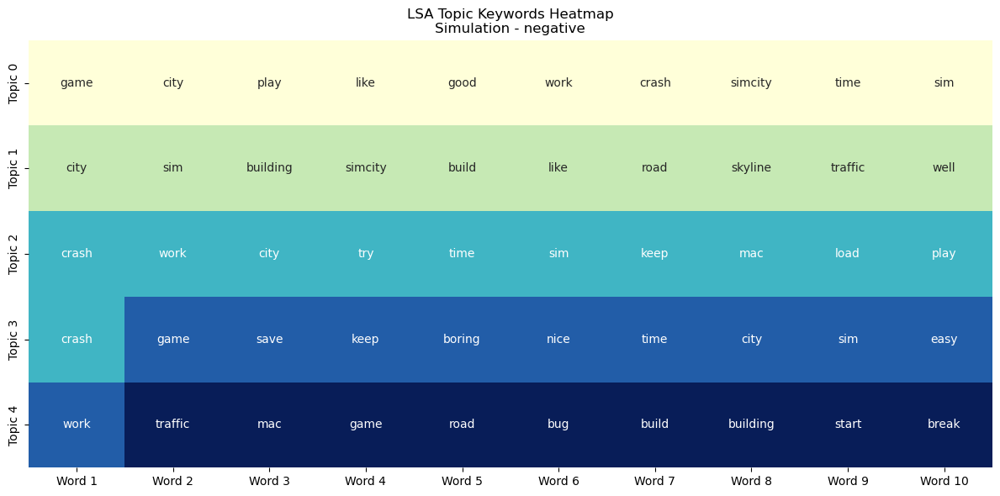

Topic #1: game, work, city, time, play, mod, road, like, thing, update
Topic #2: game, play, computer, money, try, like, waste, load, start, buy
Topic #3: game, face, extreme, road, like, mod, dlc, city, well, simcity
Topic #4: game, play, buy, work, try, crash, good, run, graphic, mac
Topic #5: city, game, building, like, build, simcity, traffic, sim, good, road

Topic #1: game, city, play, like, good, work, crash, simcity, time, sim
Topic #2: city, sim, building, simcity, build, like, road, skyline, traffic, well
Topic #3: crash, work, city, try, time, sim, keep, mac, load, play
Topic #4: crash, game, save, keep, boring, nice, time, city, sim, easy
Topic #5: work, traffic, mac, game, road, bug, build, building, start, break

📏 Coherence Score (LDA): 0.4219
📏 Coherence Score (LSA): 0.4049
🔚==================================================

🔍 ANALYZING: OPEN WORLD - POSITIVE
📝 Total Reviews: 30593


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


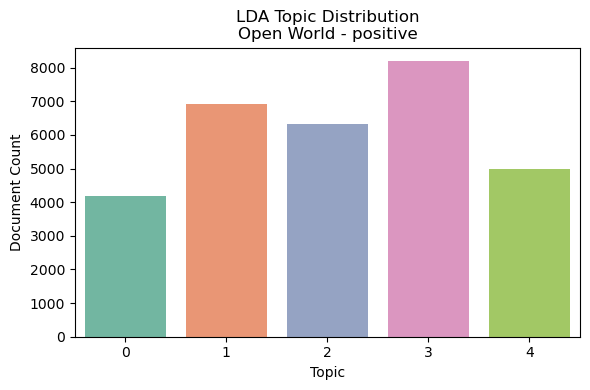

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


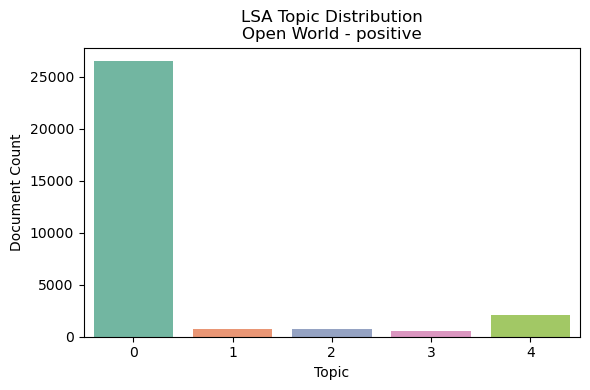

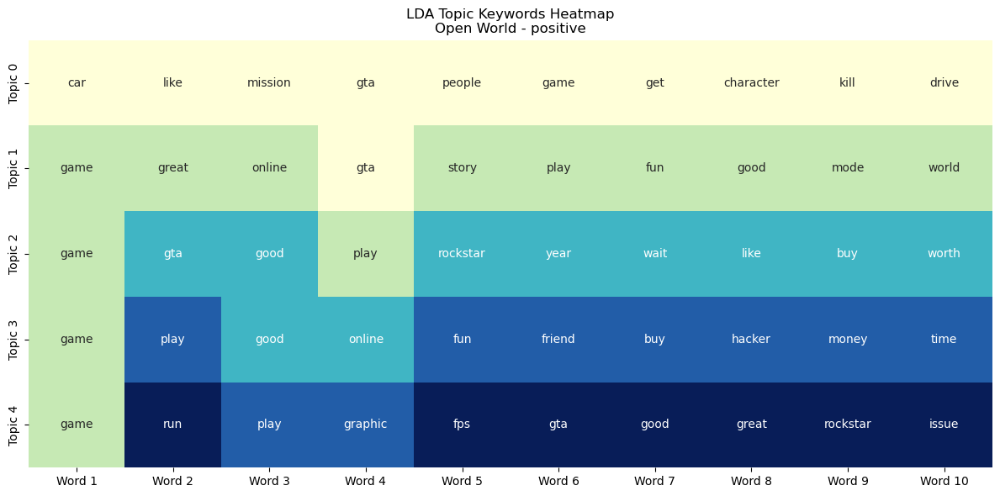

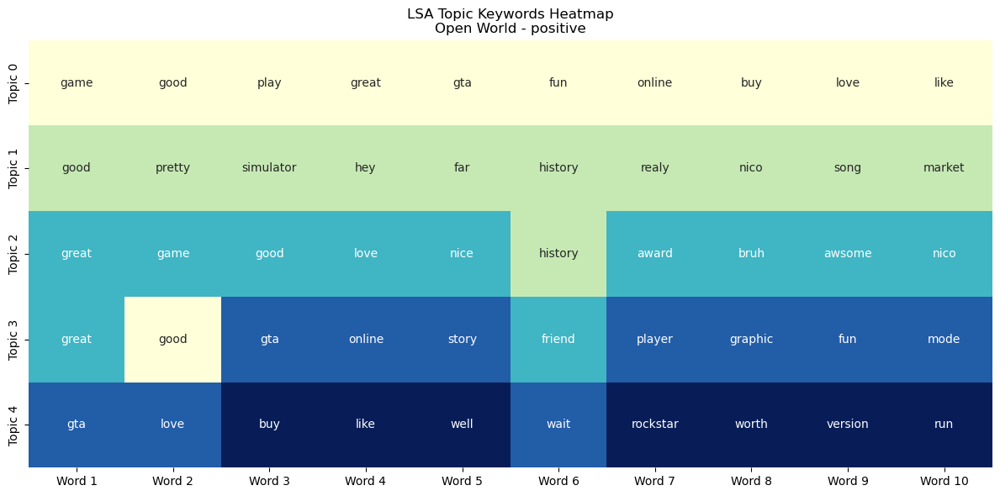

Topic #1: car, like, mission, gta, people, game, get, character, kill, drive
Topic #2: game, great, online, gta, story, play, fun, good, mode, world
Topic #3: game, gta, good, play, rockstar, year, wait, like, buy, worth
Topic #4: game, play, good, online, fun, friend, buy, hacker, money, time
Topic #5: game, run, play, graphic, fps, gta, good, great, rockstar, issue

Topic #1: game, good, play, great, gta, fun, online, buy, love, like
Topic #2: good, pretty, simulator, hey, far, history, realy, nico, song, market
Topic #3: great, game, good, love, nice, history, award, bruh, awsome, nico
Topic #4: great, good, gta, online, story, friend, player, graphic, fun, mode
Topic #5: gta, love, buy, like, well, wait, rockstar, worth, version, run

📏 Coherence Score (LDA): 0.5454
📏 Coherence Score (LSA): 0.4740
🔚==================================================

🔍 ANALYZING: OPEN WORLD - NEGATIVE
📝 Total Reviews: 10923


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


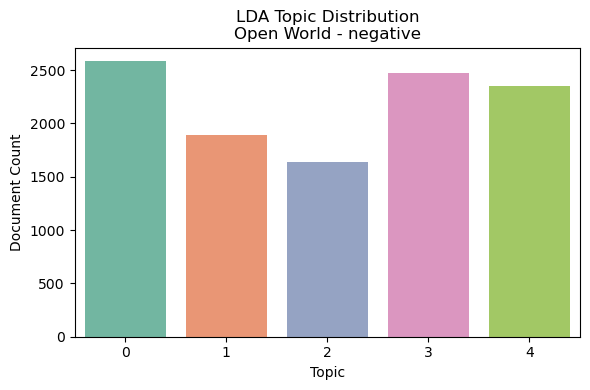

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


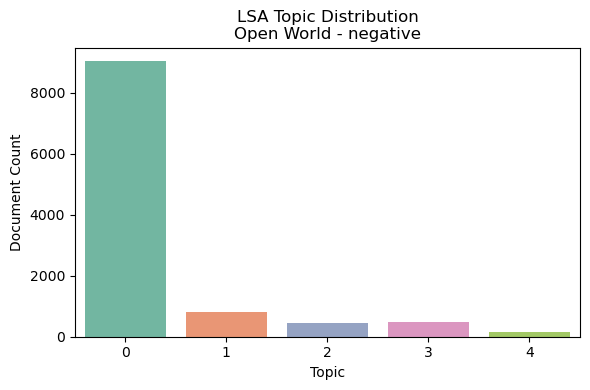

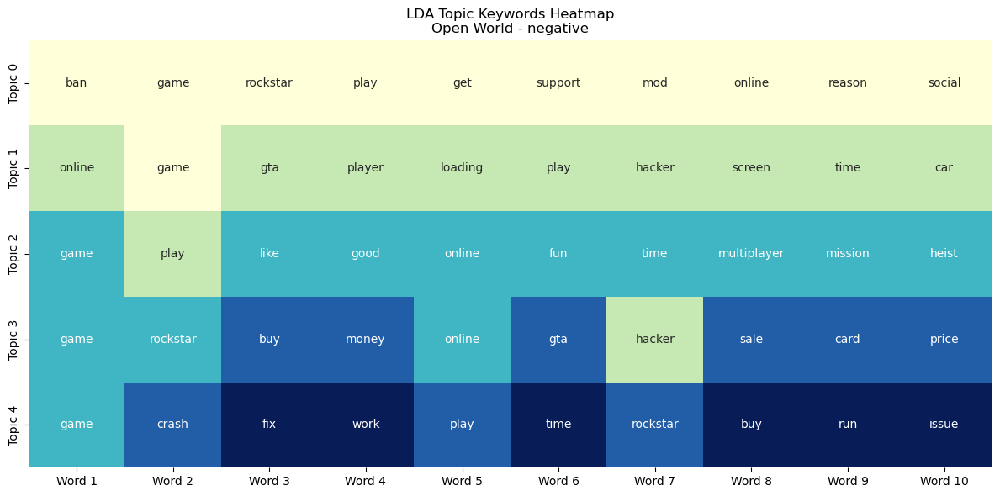

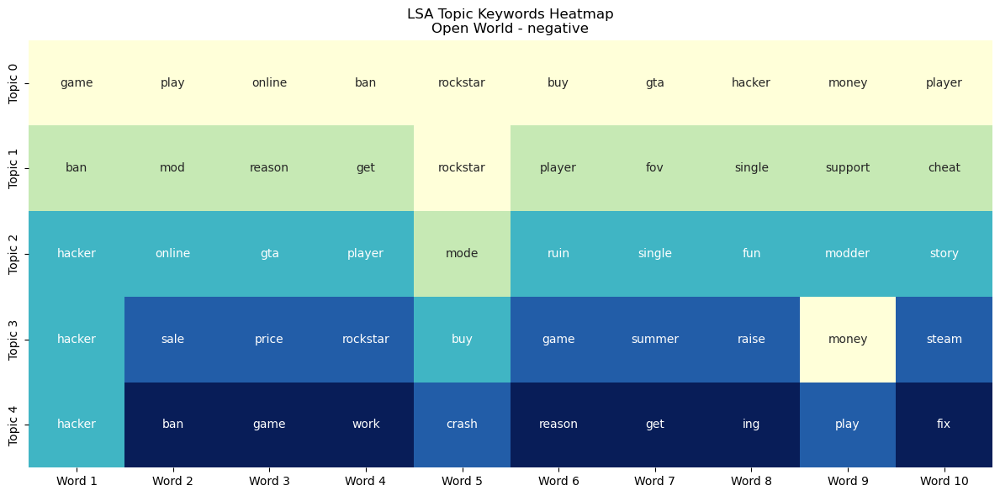

Topic #1: ban, game, rockstar, play, get, support, mod, online, reason, social
Topic #2: online, game, gta, player, loading, play, hacker, screen, time, car
Topic #3: game, play, like, good, online, fun, time, multiplayer, mission, heist
Topic #4: game, rockstar, buy, money, online, gta, hacker, sale, card, price
Topic #5: game, crash, fix, work, play, time, rockstar, buy, run, issue

Topic #1: game, play, online, ban, rockstar, buy, gta, hacker, money, player
Topic #2: ban, mod, reason, get, rockstar, player, fov, single, support, cheat
Topic #3: hacker, online, gta, player, mode, ruin, single, fun, modder, story
Topic #4: hacker, sale, price, rockstar, buy, game, summer, raise, money, steam
Topic #5: hacker, ban, game, work, crash, reason, get, ing, play, fix

📏 Coherence Score (LDA): 0.4942
📏 Coherence Score (LSA): 0.5374
🔚==================================================

🔍 ANALYZING: SURVIVAL - POSITIVE
📝 Total Reviews: 5843


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


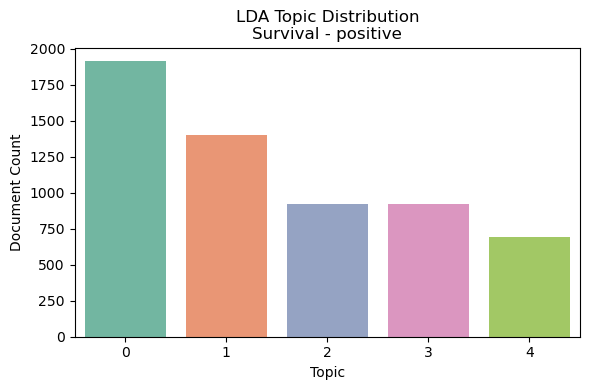

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


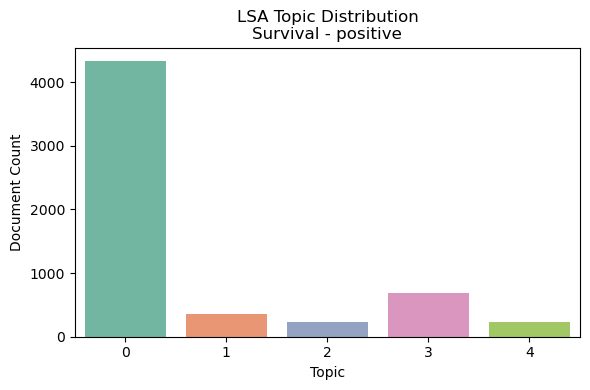

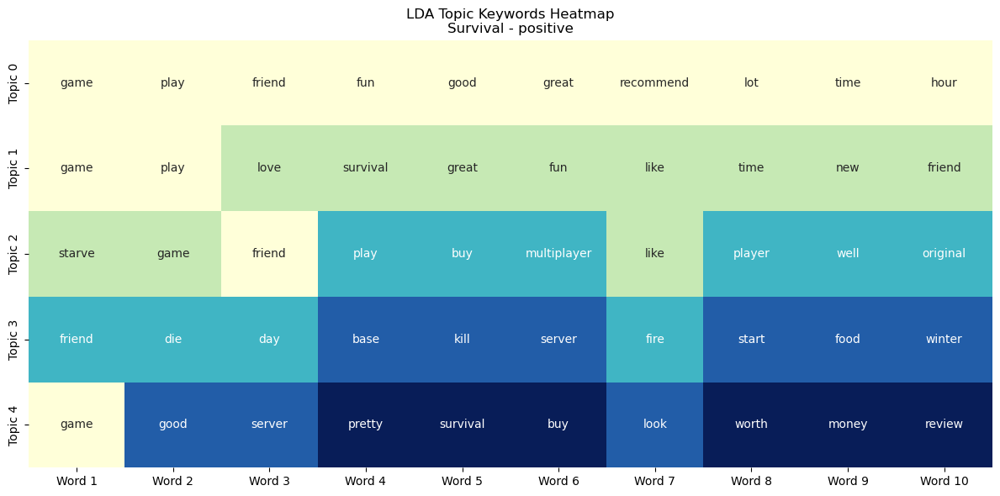

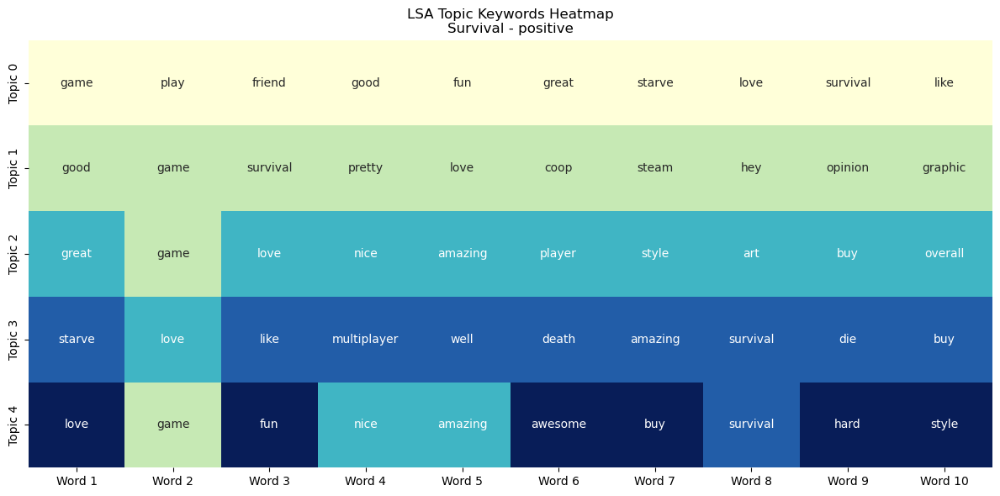

Topic #1: game, play, friend, fun, good, great, recommend, lot, time, hour
Topic #2: game, play, love, survival, great, fun, like, time, new, friend
Topic #3: starve, game, friend, play, buy, multiplayer, like, player, well, original
Topic #4: friend, die, day, base, kill, server, fire, start, food, winter
Topic #5: game, good, server, pretty, survival, buy, look, worth, money, review

Topic #1: game, play, friend, good, fun, great, starve, love, survival, like
Topic #2: good, game, survival, pretty, love, coop, steam, hey, opinion, graphic
Topic #3: great, game, love, nice, amazing, player, style, art, buy, overall
Topic #4: starve, love, like, multiplayer, well, death, amazing, survival, die, buy
Topic #5: love, game, fun, nice, amazing, awesome, buy, survival, hard, style

📏 Coherence Score (LDA): 0.5622
📏 Coherence Score (LSA): 0.4878
🔚==================================================
⚠️ Skipping Survival - negative (only 257 reviews)

🔍 ANALYZING: HORROR - POSITIVE
📝 Total Review

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


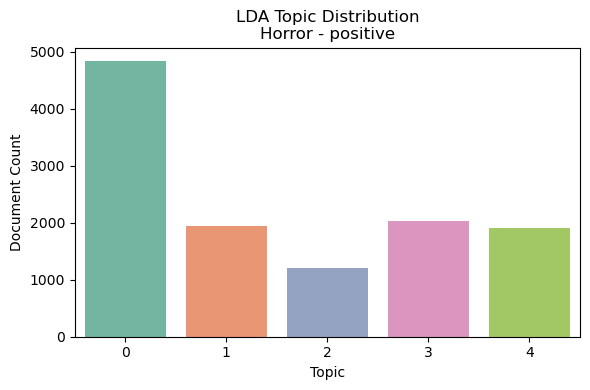

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


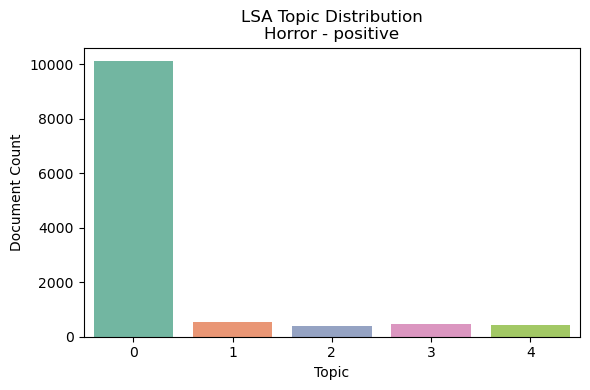

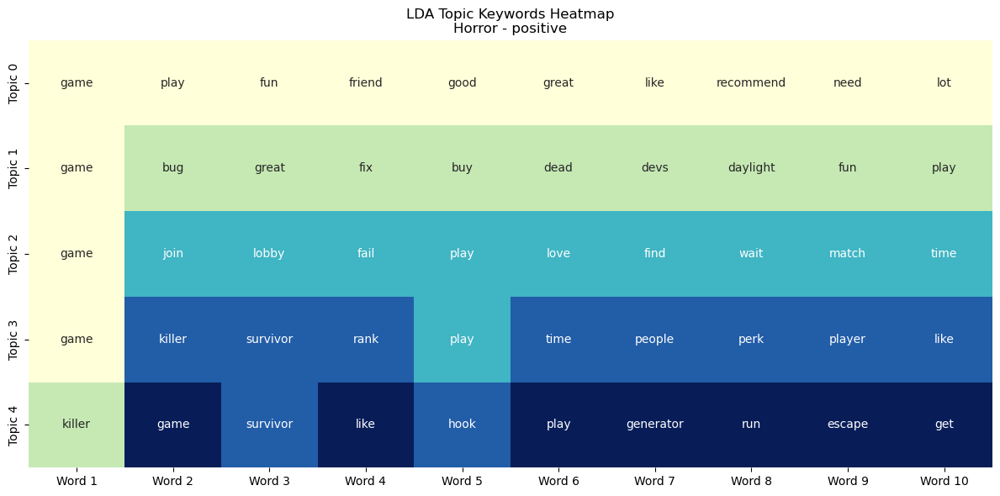

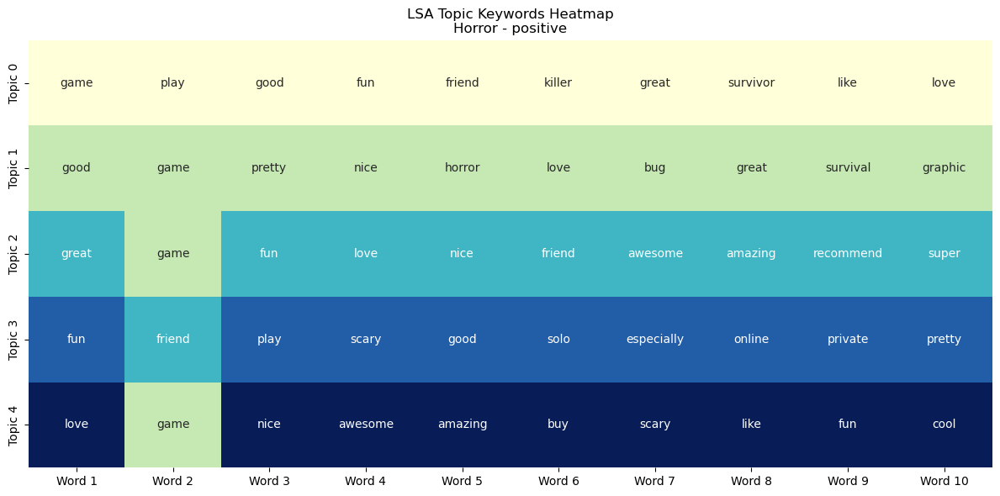

Topic #1: game, play, fun, friend, good, great, like, recommend, need, lot
Topic #2: game, bug, great, fix, buy, dead, devs, daylight, fun, play
Topic #3: game, join, lobby, fail, play, love, find, wait, match, time
Topic #4: game, killer, survivor, rank, play, time, people, perk, player, like
Topic #5: killer, game, survivor, like, hook, play, generator, run, escape, get

Topic #1: game, play, good, fun, friend, killer, great, survivor, like, love
Topic #2: good, game, pretty, nice, horror, love, bug, great, survival, graphic
Topic #3: great, game, fun, love, nice, friend, awesome, amazing, recommend, super
Topic #4: fun, friend, play, scary, good, solo, especially, online, private, pretty
Topic #5: love, game, nice, awesome, amazing, buy, scary, like, fun, cool

📏 Coherence Score (LDA): 0.4916
📏 Coherence Score (LSA): 0.5042
🔚==================================================

🔍 ANALYZING: HORROR - NEGATIVE
📝 Total Reviews: 6457


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


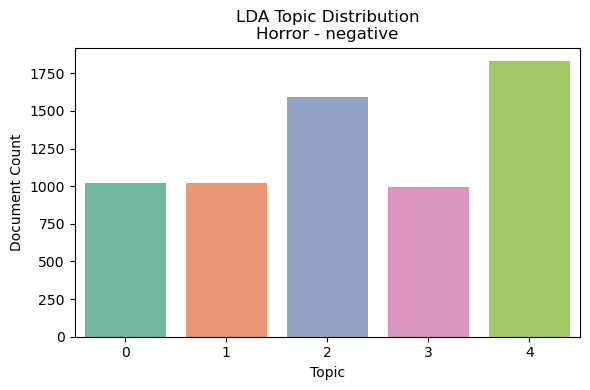

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


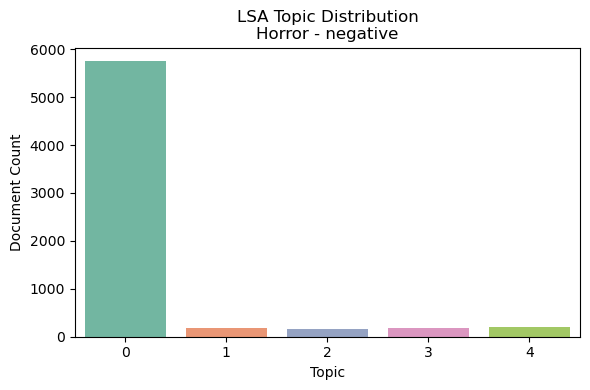

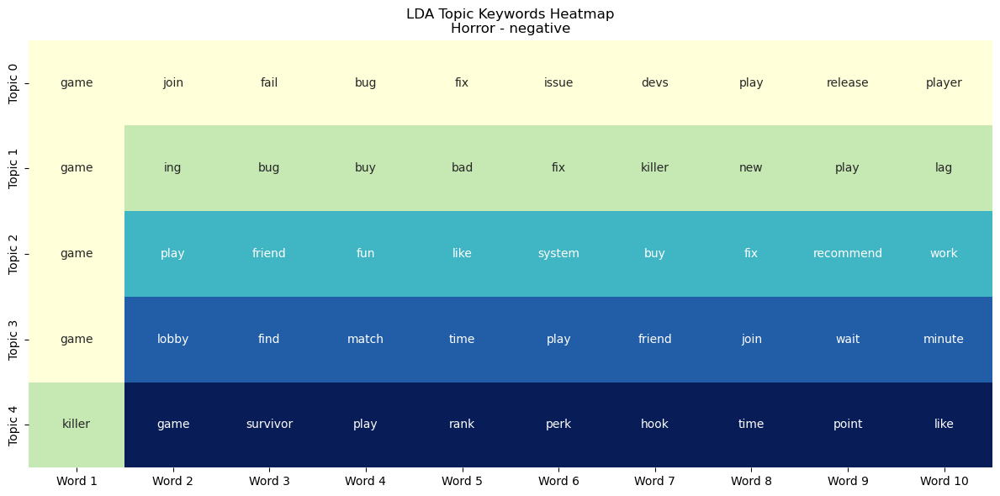

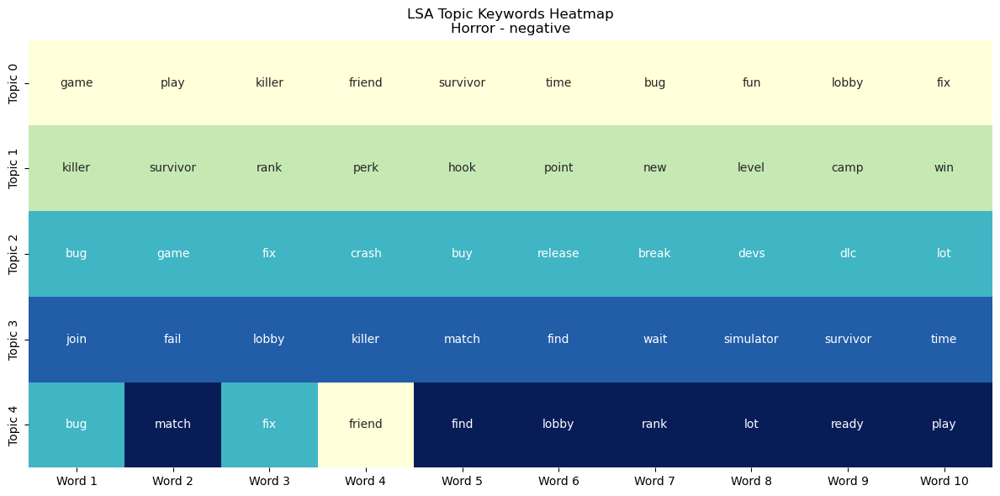

Topic #1: game, join, fail, bug, fix, issue, devs, play, release, player
Topic #2: game, ing, bug, buy, bad, fix, killer, new, play, lag
Topic #3: game, play, friend, fun, like, system, buy, fix, recommend, work
Topic #4: game, lobby, find, match, time, play, friend, join, wait, minute
Topic #5: killer, game, survivor, play, rank, perk, hook, time, point, like

Topic #1: game, play, killer, friend, survivor, time, bug, fun, lobby, fix
Topic #2: killer, survivor, rank, perk, hook, point, new, level, camp, win
Topic #3: bug, game, fix, crash, buy, release, break, devs, dlc, lot
Topic #4: join, fail, lobby, killer, match, find, wait, simulator, survivor, time
Topic #5: bug, match, fix, friend, find, lobby, rank, lot, ready, play

📏 Coherence Score (LDA): 0.4636
📏 Coherence Score (LSA): 0.5117
🔚==================================================

🔍 ANALYZING: PUZZLE - POSITIVE
📝 Total Reviews: 22520


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


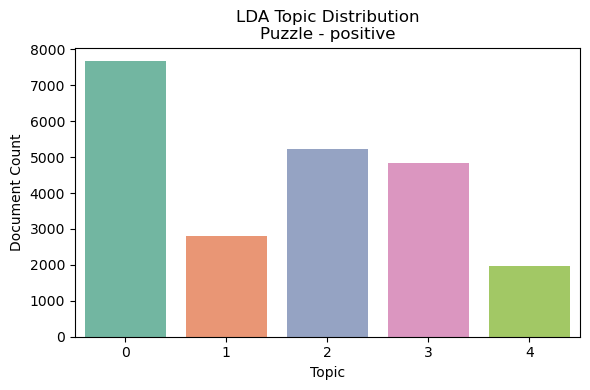

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


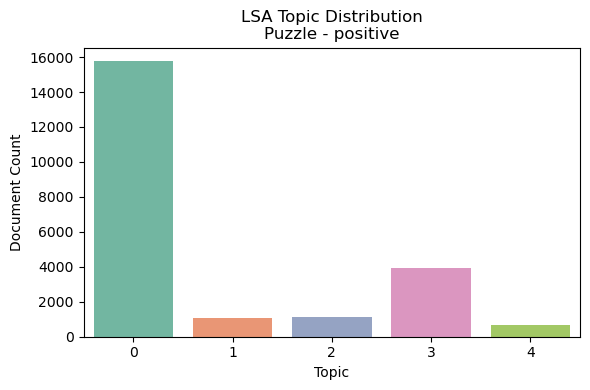

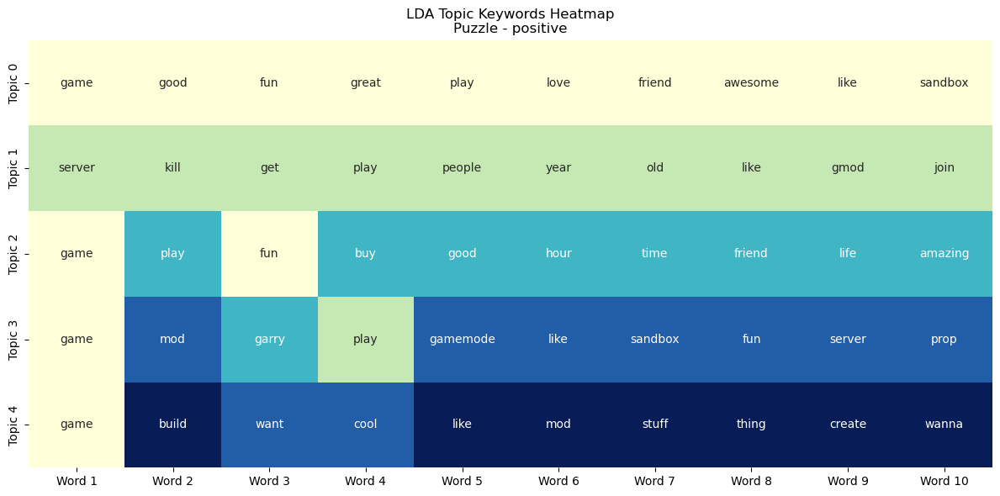

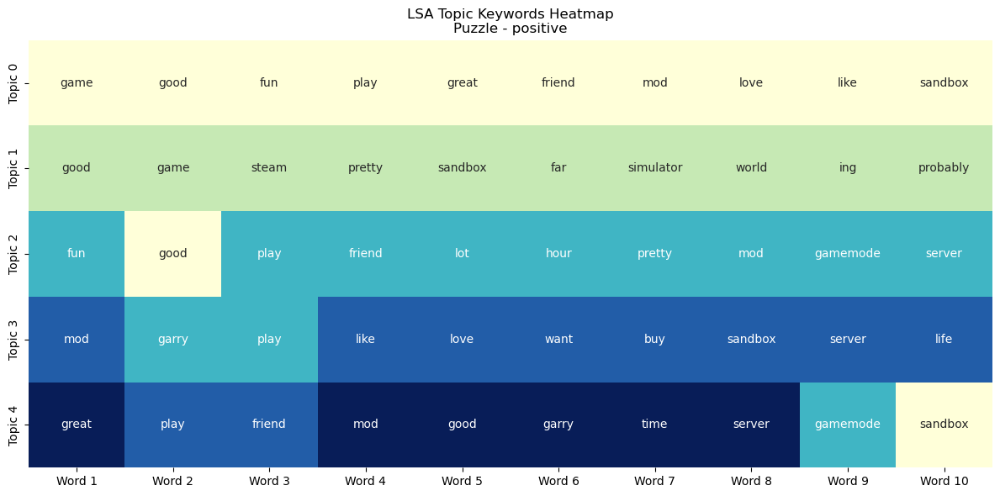

Topic #1: game, good, fun, great, play, love, friend, awesome, like, sandbox
Topic #2: server, kill, get, play, people, year, old, like, gmod, join
Topic #3: game, play, fun, buy, good, hour, time, friend, life, amazing
Topic #4: game, mod, garry, play, gamemode, like, sandbox, fun, server, prop
Topic #5: game, build, want, cool, like, mod, stuff, thing, create, wanna

Topic #1: game, good, fun, play, great, friend, mod, love, like, sandbox
Topic #2: good, game, steam, pretty, sandbox, far, simulator, world, ing, probably
Topic #3: fun, good, play, friend, lot, hour, pretty, mod, gamemode, server
Topic #4: mod, garry, play, like, love, want, buy, sandbox, server, life
Topic #5: great, play, friend, mod, good, garry, time, server, gamemode, sandbox

📏 Coherence Score (LDA): 0.6020
📏 Coherence Score (LSA): 0.5843
🔚==================================================

🔍 ANALYZING: PUZZLE - NEGATIVE
📝 Total Reviews: 4954


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


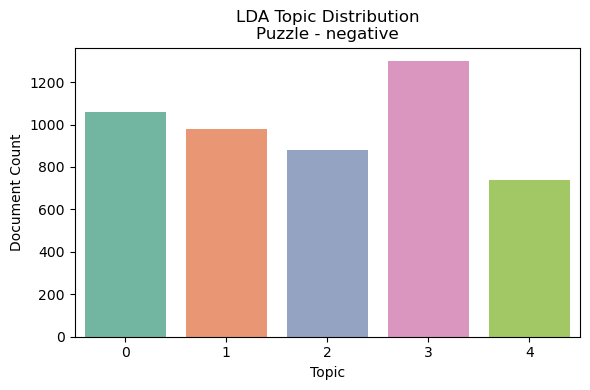

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


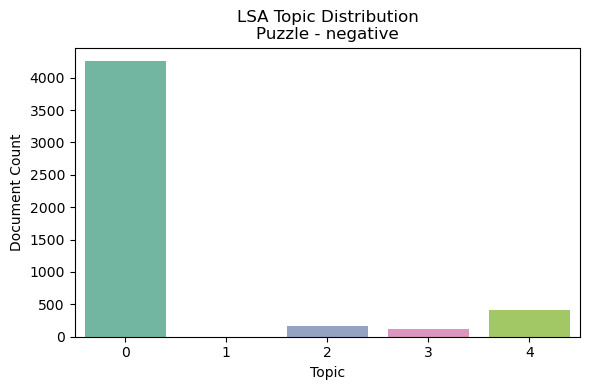

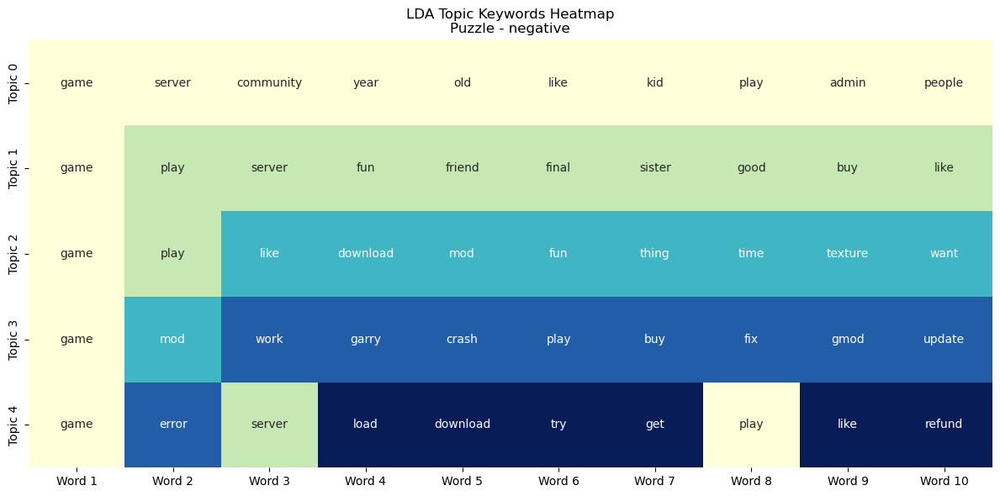

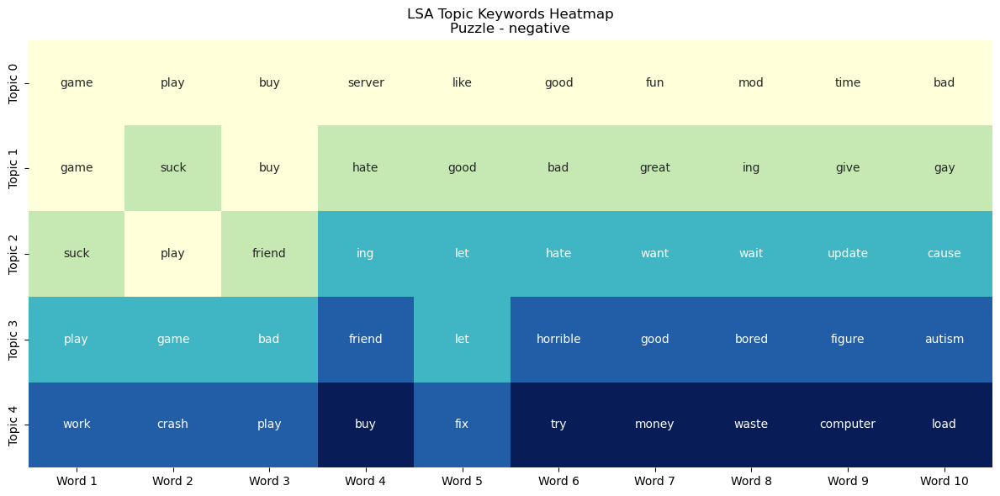

Topic #1: game, server, community, year, old, like, kid, play, admin, people
Topic #2: game, play, server, fun, friend, final, sister, good, buy, like
Topic #3: game, play, like, download, mod, fun, thing, time, texture, want
Topic #4: game, mod, work, garry, crash, play, buy, fix, gmod, update
Topic #5: game, error, server, load, download, try, get, play, like, refund

Topic #1: game, play, buy, server, like, good, fun, mod, time, bad
Topic #2: game, suck, buy, hate, good, bad, great, ing, give, gay
Topic #3: suck, play, friend, ing, let, hate, want, wait, update, cause
Topic #4: play, game, bad, friend, let, horrible, good, bored, figure, autism
Topic #5: work, crash, play, buy, fix, try, money, waste, computer, load

📏 Coherence Score (LDA): 0.5801
📏 Coherence Score (LSA): 0.4534
🔚==================================================

🔍 ANALYZING: MOBA - POSITIVE
📝 Total Reviews: 59591


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


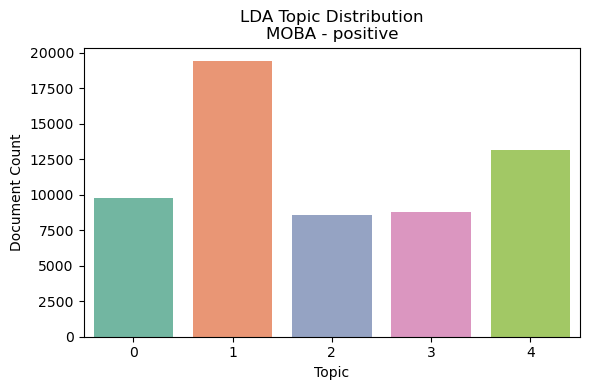

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


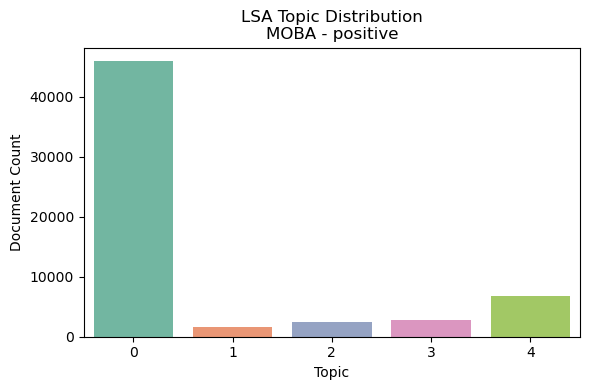

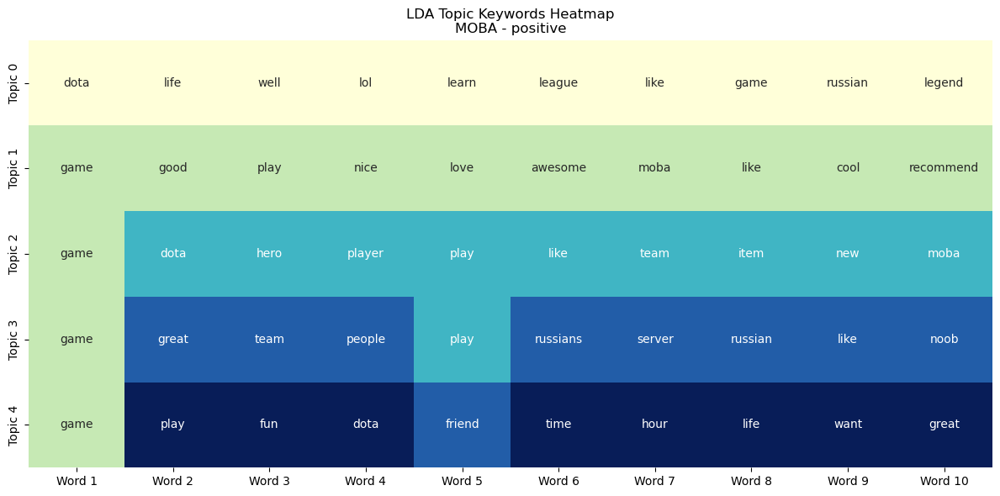

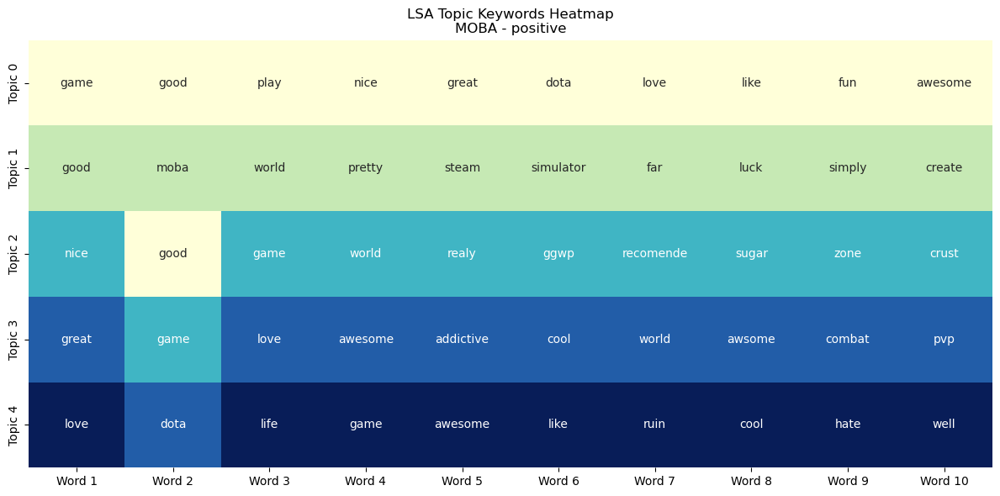

Topic #1: dota, life, well, lol, learn, league, like, game, russian, legend
Topic #2: game, good, play, nice, love, awesome, moba, like, cool, recommend
Topic #3: game, dota, hero, player, play, like, team, item, new, moba
Topic #4: game, great, team, people, play, russians, server, russian, like, noob
Topic #5: game, play, fun, dota, friend, time, hour, life, want, great

Topic #1: game, good, play, nice, great, dota, love, like, fun, awesome
Topic #2: good, moba, world, pretty, steam, simulator, far, luck, simply, create
Topic #3: nice, good, game, world, realy, ggwp, recomende, sugar, zone, crust
Topic #4: great, game, love, awesome, addictive, cool, world, awsome, combat, pvp
Topic #5: love, dota, life, game, awesome, like, ruin, cool, hate, well

📏 Coherence Score (LDA): 0.5861
📏 Coherence Score (LSA): 0.3753
🔚==================================================

🔍 ANALYZING: MOBA - NEGATIVE
📝 Total Reviews: 10291


/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


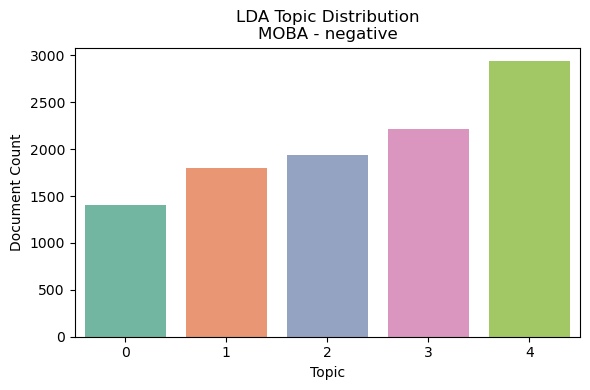

/var/folders/81/vg4jc45d24qfy4y09fmt7ftm0000gn/T/ipykernel_11590/1374994740.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette="Set2")


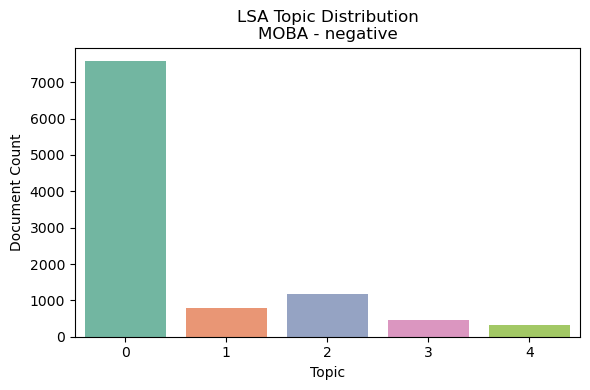

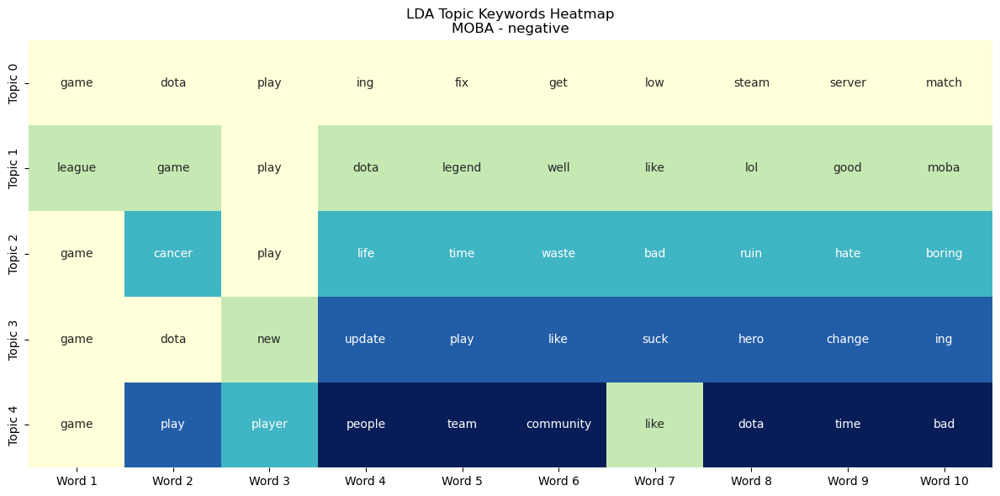

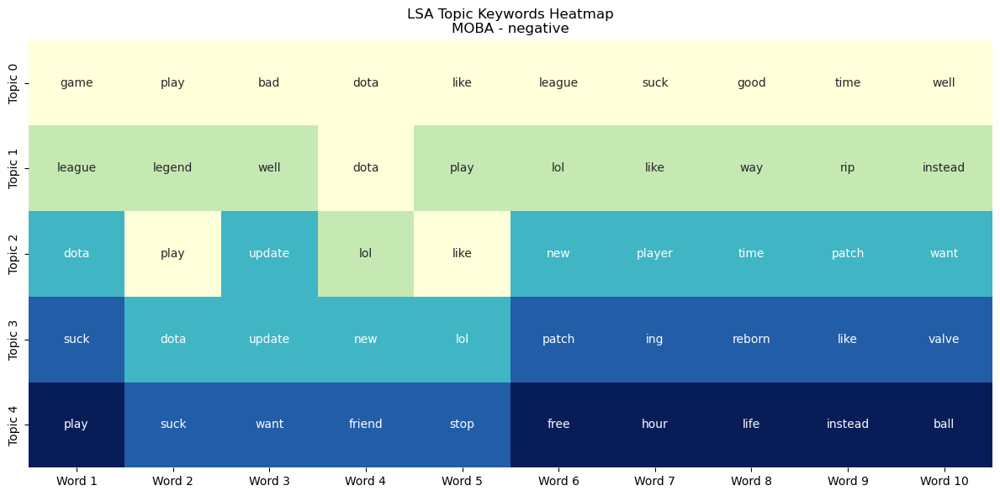

Topic #1: game, dota, play, ing, fix, get, low, steam, server, match
Topic #2: league, game, play, dota, legend, well, like, lol, good, moba
Topic #3: game, cancer, play, life, time, waste, bad, ruin, hate, boring
Topic #4: game, dota, new, update, play, like, suck, hero, change, ing
Topic #5: game, play, player, people, team, community, like, dota, time, bad

Topic #1: game, play, bad, dota, like, league, suck, good, time, well
Topic #2: league, legend, well, dota, play, lol, like, way, rip, instead
Topic #3: dota, play, update, lol, like, new, player, time, patch, want
Topic #4: suck, dota, update, new, lol, patch, ing, reborn, like, valve
Topic #5: play, suck, want, friend, stop, free, hour, life, instead, ball

📏 Coherence Score (LDA): 0.5329
📏 Coherence Score (LSA): 0.5088
🔚==================================================


In [37]:
#Analysing Topic Distribution + Topic Keyword Heatmap + Coherence Score
for genre in df_filtered['genre'].unique():
    for sentiment in ['positive', 'negative']:
        subset = df_filtered[(df_filtered['genre'] == genre) & (df_filtered['sentiment'] == sentiment)]
        texts = subset['cleaned_review'].dropna()

        if len(texts) < 500:
            print(f"⚠️ Skipping {genre} - {sentiment} (only {len(texts)} reviews)")
            continue

        print(f"\n🔍 ANALYZING: {genre.upper()} - {sentiment.upper()}")
        print(f"📝 Total Reviews: {len(texts)}")

        # Vectorize
        count_vec = CountVectorizer(max_features=1000, min_df=5)
        tfidf_vec = TfidfVectorizer(max_features=1000, min_df=5)

        count_dtm = count_vec.fit_transform(texts)
        tfidf_dtm = tfidf_vec.fit_transform(texts)

        # Train models
        n_topics = 5
        lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
        lsa = TruncatedSVD(n_components=n_topics, random_state=42)

        lda_matrix = lda.fit_transform(count_dtm)
        lsa_matrix = lsa.fit_transform(tfidf_dtm)

        # Step 1: Topic Distribution Bar Plots
        plot_topic_distribution(lda_matrix, "LDA", genre, sentiment)
        plot_topic_distribution(lsa_matrix, "LSA", genre, sentiment)

        # Step 2: Heatmaps of Top Words
        plot_topic_keywords_heatmap(lda, count_vec.get_feature_names_out(), "LDA", genre, sentiment)
        plot_topic_keywords_heatmap(lsa, tfidf_vec.get_feature_names_out(), "LSA", genre, sentiment)

        # Step 4: Coherence Scores
        lda_words = display_topics(lda, count_vec.get_feature_names_out(), num_top_words=10)
        lsa_words = display_topics(lsa, tfidf_vec.get_feature_names_out(), num_top_words=10)

        lda_score = compute_coherence_score(texts, lda_words)
        lsa_score = compute_coherence_score(texts, lsa_words)

        print(f"📏 Coherence Score (LDA): {lda_score:.4f}")
        print(f"📏 Coherence Score (LSA): {lsa_score:.4f}")
        print("🔚" + "=" * 50)
